# imports

In [1]:
%load_ext autoreload
%autoreload 2


In [2]:
import sys, os, time
sys.path.append('/mnt/home/cmodi/.local/lib/python3.8/site-packages/')


In [3]:
%pylab inline


%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [4]:
import sbi
import torch
import wandb
from wandb import Api
import zeus
import emcee

from arviz import rhat, ess, autocorr


In [5]:
sys.path.append('../src/')

import loader_pk
import sbitools, sbiplots
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [6]:
cosmonames = sbitools.quijote_params()[-1] + ['$c_s$']
params = sbitools.quijote_params()[0]

# testidx = np.load('/mnt/ceph/users/cmodi/HySBI/test-train-splits/test-N2000-f0.15-S0.npy')
testidx = np.load('../data/testidx_p0-0.15-0.45_p4-0.65-0.95.npy')
testidx;

In [7]:
bounds = [params.min(axis=0), params.max(axis=0)]
print(bounds)
goodids = []
for pid in testidx:
    p = params[pid]
    good = True
    for j in range(5):
        r = bounds[1][j] - bounds[0][j] 
        if (bounds[0][j] + 0.25*r < p[j] < bounds[1][j] - 0.25*r):
            pass
        else:
            good = False
    if good:
        print(pid, p)
        goodids.append(pid)

[array([0.1001 , 0.03001, 0.5001 , 0.8001 , 0.6001 ]), array([0.4999 , 0.06999, 0.8999 , 1.1999 , 0.9999 ])]
865 [0.3199  0.04035 0.7235  1.0251  0.8329 ]
663 [0.3223  0.04625 0.7015  0.9607  0.8311 ]
1964 [0.3157  0.05723 0.7491  0.9563  0.8091 ]
121 [0.2541  0.04943 0.7997  0.9459  0.8819 ]
696 [0.2057  0.05959 0.7193  1.0443  0.8343 ]
1539 [0.3149  0.05077 0.7161  0.9655  0.8847 ]
1329 [0.3403  0.05119 0.7409  0.9357  0.8915 ]
909 [0.3349  0.04321 0.7655  1.0095  0.7535 ]
964 [0.3151  0.04039 0.6893  0.9023  0.7923 ]


In [8]:
def clean_chains(s, essmin=20, verbose=False):
    good = np.array([True] * s.shape[1])
    for idim in range(s.shape[-1]):
        esses = np.array(list(map(ess, s[..., idim].T)))
        clean = (esses > essmin)
        # clean = (esses > (esses.mean() - 2.5*esses.std()))
        good *= clean
    if verbose: print("Bad chains dropped : ", good.size - good.sum())
    return s[:, good, :]


def narrow_prior(t=5):

    masks = np.ones(params.shape[0])
    for i in range(5):
        vals = params[:, i].copy()
        m0, m1 = vals.min(), vals.max()
        r = (m1-m0)*t/100.
        mask = np.ones(vals.size)
        mask[vals < m0 + r] = 0
        mask[vals > m1 - r] = 0
        masks *= mask
    return masks

prior_t5 = narrow_prior().astype(bool)
prior_t10 = narrow_prior(t=10).astype(bool)
prior_t20 = narrow_prior(t=20).astype(bool)
prior_t25 = narrow_prior(t=25).astype(bool)


In [9]:

def corner(samples, truevals=None, savepath="./tmp/", savename=None, save=True, maxdims=10, titles=None):
    '''Make corner plot for the distribution from samples                                                                                                                                                                                                                                                                     
    '''
    D = samples.shape[-1]
    D = min(D, maxdims)
    if titles is None:
        titles = [f'W[{i}]' for i in range(D)]
    fig, ax = plt.subplots(D, D, figsize=(3*D, 2*D), sharex='col')
    for i in range(D):
        for j in range(D):
            if i==j:
                ax[i, j].hist(samples[:, i])
                ax[i, j].set_title(titles[i])
                if truevals is not None:
                    ax[i, i].axvline(truevals[i], color='k', lw=0.5)
            elif i>j:
                ax[i, j].plot(samples[:, j], samples[:, i], '.')
                if truevals is not None:
                    ax[i, j].axhline(truevals[i], color='k', lw=0.5)
                    ax[i, j].axvline(truevals[j], color='k', lw=0.5)
            else:
                ax[i, j].axis('off')

    for i in range(D):
        ax[i, i].set_title(titles[i])

    plt.tight_layout()
    return fig, ax




# rankplots

In [12]:
path = '/mnt/ceph/users/cmodi/HySBI/matter/samples/'
runs = [f'{path}/PT/kmax0.15/LH%d.npy',
        f'{path}/PT_varycov/kmax0.15/LH%d.npy',
        f'{path}/PT/kmax0.1/LH%d.npy',
        f'{path}/PT/kmax0.2/LH%d.npy',
        f'{path}/snle//kmax0.5-kmin0.001-logit-standardize/ens10//LH%d.npy',
        f'{path}/snle_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10/LH%d.npy',
        
        f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.15-nsubs1-splits1-standardize-standardize_cond/ens10/LH%d.npy',
        # f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.15-logit-logit_cond-nsubs1-splits1-standardize-standardize_cond/ens10/LH%d.npy',
        f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.15-nsubs1-splits2-standardize-standardize_cond/ens10/LH%d.npy',
        # f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.15-logit-logit_cond-nsubs1-splits2-standardize-standardize_cond/ens10/LH%d.npy',
        # f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.15-logit-logit_cond-nsubs2-splits2-standardize-standardize_cond/ens10/LH%d.npy',
        f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs2-splits2-standardize-standardize_cond/ens10/LH%d.npy',
        f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond/ens10/LH%d.npy',
        # f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond/ens5//LH%d.npy',
        f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.1-meanf-nsubs8-splits2-standardize-standardize_cond/ens5/LH%d.npy',
        # f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.15-logit-logit_cond-meanf-nsubs8-splits2-standardize-standardize_cond/ens10/LH%d.npy',
        # f'{path}/hybrid2_sub/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond/ens10/LH%d.npy',
        # f'{path}/hybrid2_small_sub/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond/ens10/LH%d.npy',
        # f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv-interp/ens10/LH%d.npy',
        # f'{path}/hybrid2_sub/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv-interp/ens10/LH%d.npy',
        # f'{path}/hybrid2_small/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv-interp/ens10/LH%d.npy',
        
        f'{path}/hybrid2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-sym/ens10/LH%d.npy',
        f'{path}/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy',
        f'{path}/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs4-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy',
        f'{path}/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs1-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy',
        f'{path}/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-logit-logit_cond-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy',
        
        f'{path}/hybrid2_small_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy',
        
        f'{path}/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.1-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20/LH%d.npy',
        
        f'{path}/hybrid2_indep_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10/LH%d.npy',
        
        f'{path}/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10_varycov/LH%d.npy',
        f'{path}/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH%d.npy',
        f'{path}/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs4-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH%d.npy',
        f'{path}/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs1-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH%d.npy',
        f'{path}/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.1-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10_varycov/LH%d.npy',
        f'{path}/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.1-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH%d.npy',
        f'//mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2/J3-M3-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs8-splits2-standardize-standardize_cond/ens10_varycov/LH%d.npy',
        f'//mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2/J3-M3-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs1-splits2-standardize-standardize_cond/ens10_varycov/LH%d.npy',
        f'//mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2/J3-M4-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs8-splits2-standardize-standardize_cond/ens10_varycov/LH%d.npy',
       ]


/mnt/ceph/users/cmodi/HySBI/matter/samples//snle//kmax0.5-kmin0.001-logit-standardize/ens10//LH%d.npy
(94, 5, 4)


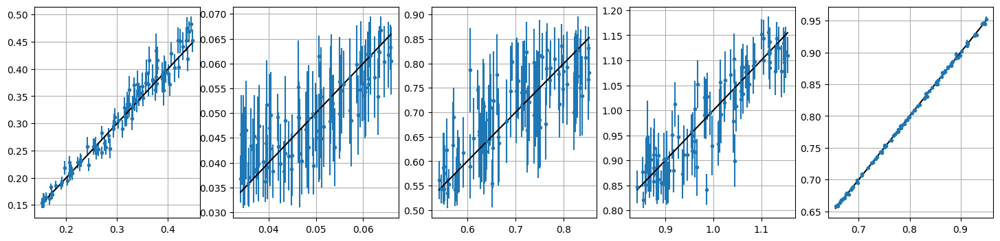

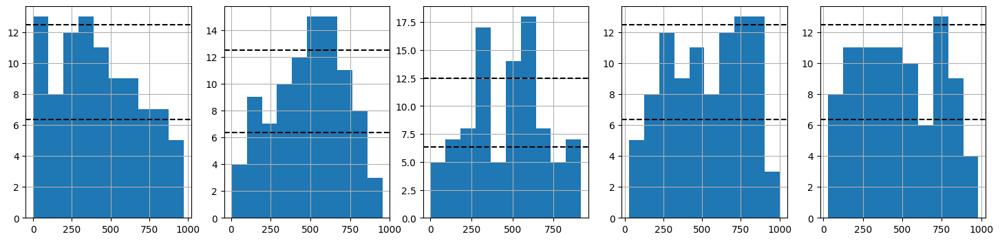

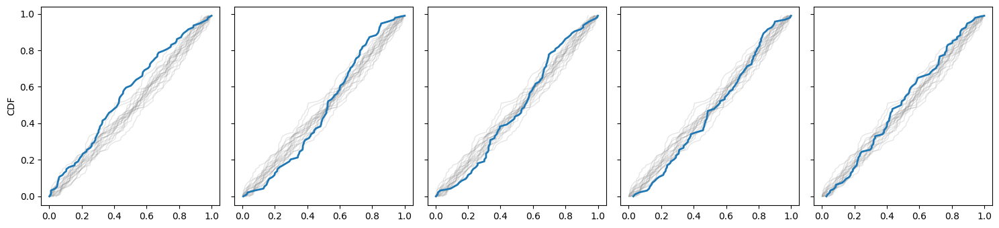

In [11]:
run = runs[4]
print(run)
nsims = len(testidx)
ss = []
allsamples = []
thin = 20 
acs = []
for i in range(nsims):
    isim = testidx[i]
    
    if prior_t10[isim] : #(0.15 < params[isim, 0] < 0.45) & (0.65 < params[isim, 4] < 0.95) :
    # if True: #(0.15 < params[isim, 0] < 0.45) & (0.65 < params[isim, 4] < 0.95) :
        try:
            # samples = (np.load(run%isim))
            samples = clean_chains(np.load(run%isim))
            converged = True
            for j in range(5):
                if ess(samples[..., j].T)/20 < 50 : converged = False
            # if not converged:
            #     continue
            allsamples.append(samples)
        except Exception as e:
            # print(e)
            continue
        mu, std = samples.mean(axis=(0, 1)), samples.std(axis=(0, 1))
        
        # acs.append([np.array(list(map(iat_imse, (samples[:, :, idim].T)))).astype(int).max() for idim in range(5)])
        # ranks = [(samples[..., j] < params[isim, j]).sum() for j in range(5)]
        ranks = [(samples[::thin, :, j] < params[isim, j]).sum() for j in range(5)]        
        ss.append(np.stack([params[isim], mu[:5], std[:5], ranks]).T)
        
ss = np.array(ss)
acs = np.array(acs)
# allsamples = np.array(allsamples)
print(ss.shape)    

##################################
fig, ax = plt.subplots(1, 5, figsize=(18, 4))

for idim in range(5):
    ax[idim].errorbar(ss[:, idim, 0], ss[:, idim, 1], ss[:, idim, 2], fmt='.')
    ax[idim].plot([ss[:, idim, 0].min(), ss[:, idim, 0].max()], [ss[:, idim, 0].min(), ss[:, idim, 0].max()], 'k')
    ax[idim].grid(which='both')
plt.show()


##################################
nbins = 10 
h = ss.shape[0]/nbins
fig, ax = plt.subplots(1, 5, figsize=(18, 4))

for idim in range(5):
    ax[idim].hist(ss[:, idim, 3], bins=nbins)
    ax[idim].axhline(h - h**.5, color='k', ls='--')
    ax[idim].axhline(h + h**.5, color='k', ls='--')
    ax[idim].grid(which='both')

plt.show()

##################################
ranks = ss[..., 3]
ncounts = ss.shape[0]
npars = 5
unicov = [np.sort(np.random.uniform(0, 1, ncounts)) for j in range(20)]

fig, ax = plt.subplots(1, npars, figsize=(npars*3, 3.5), sharex=True, sharey=True)

for i in range(5):
    xr = np.sort(ranks[:, i])
    xr = xr/xr[-1]
    cdf = np.arange(xr.size)/xr.size
    for j in range(len(unicov)): 
        ax[i].plot(unicov[j], cdf, lw=1, color='gray', alpha=0.2)
    ax[i].plot(xr, cdf, lw=2)
    # ax[i].set_title(titles[i])
    ax[0].set_ylabel('CDF')
plt.tight_layout()
plt.show()

## Loop over all runs


/PT/kmax0.15
ss shape :  (62, 5, 4)


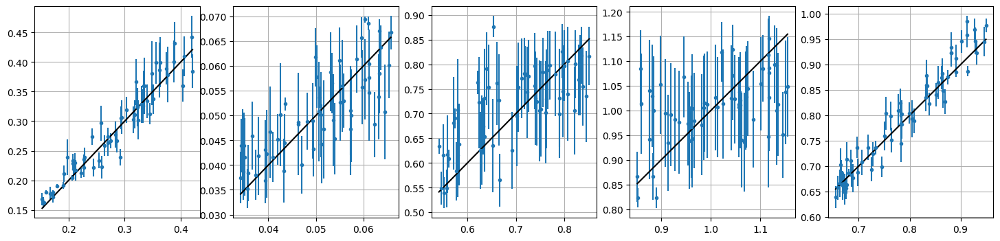

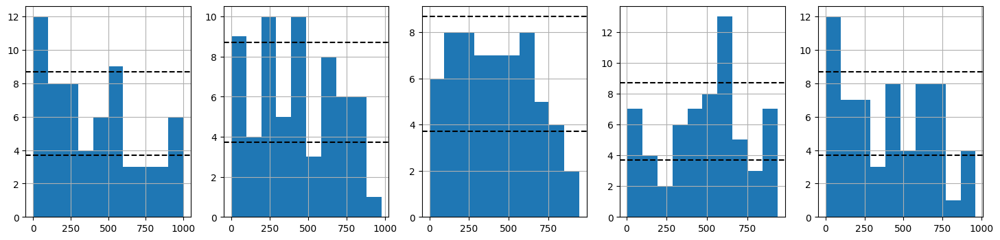

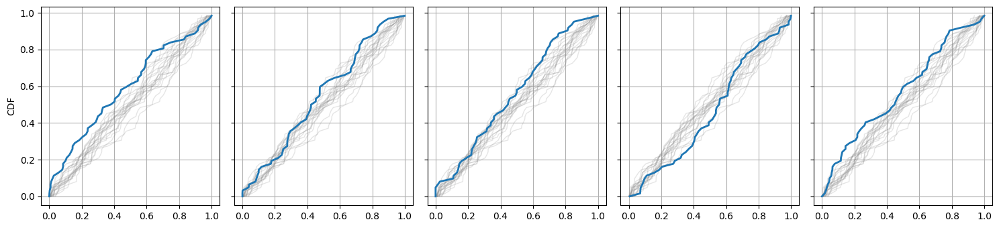


/PT_varycov/kmax0.15
ss shape :  (58, 5, 4)


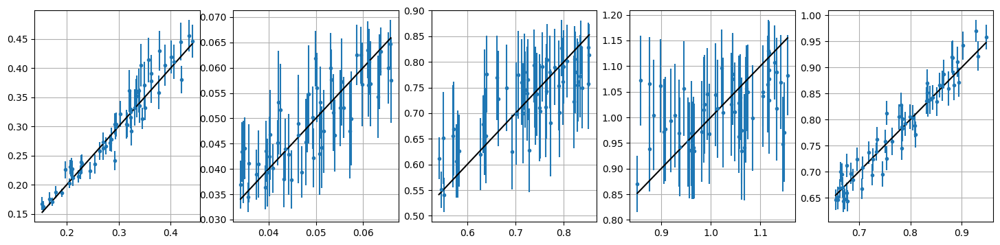

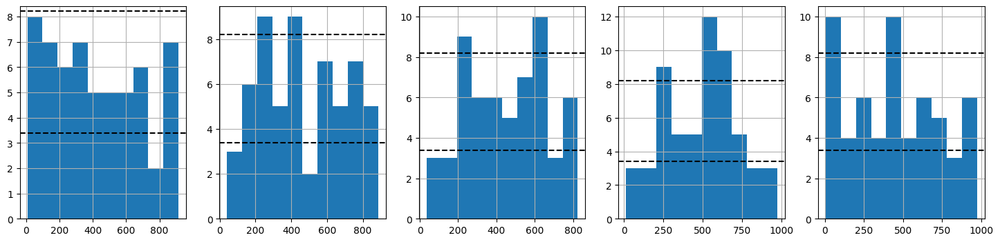

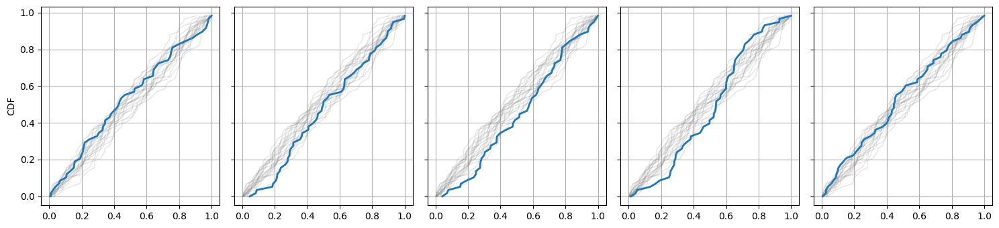


/PT/kmax0.1
ss shape :  (36, 5, 4)


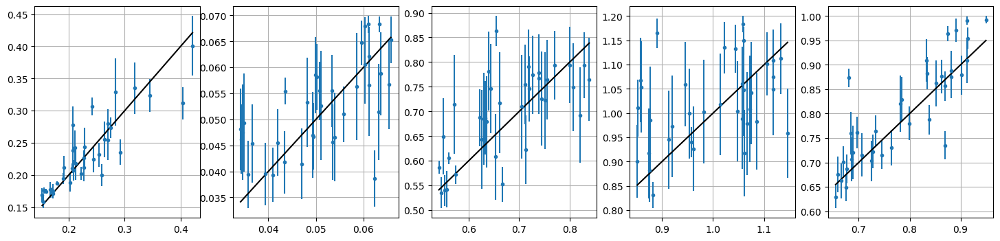

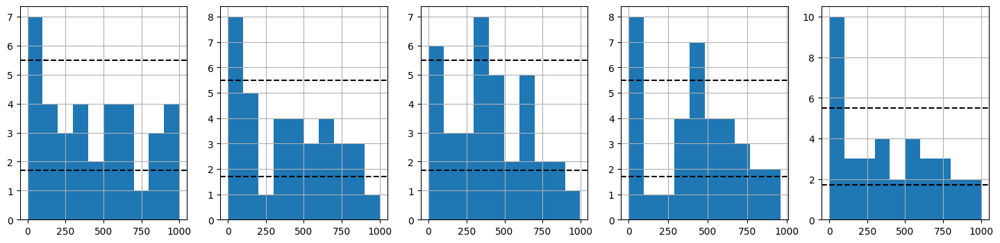

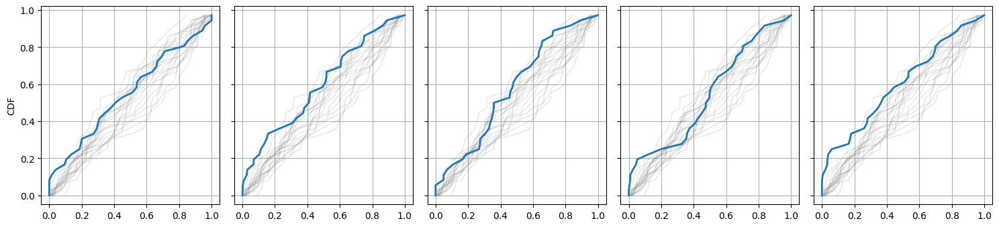


/PT/kmax0.2
ss shape :  (61, 5, 4)


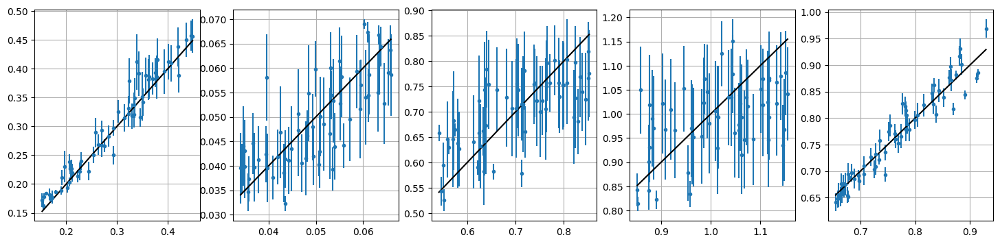

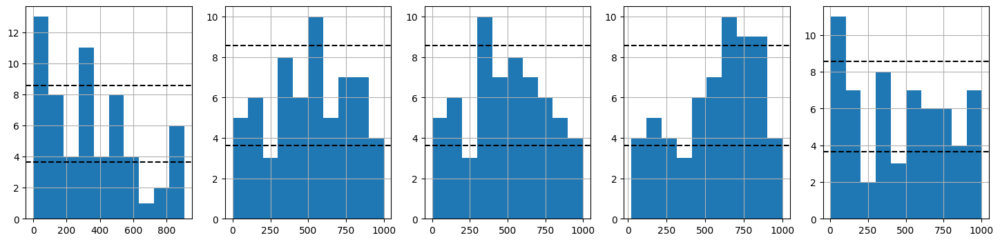

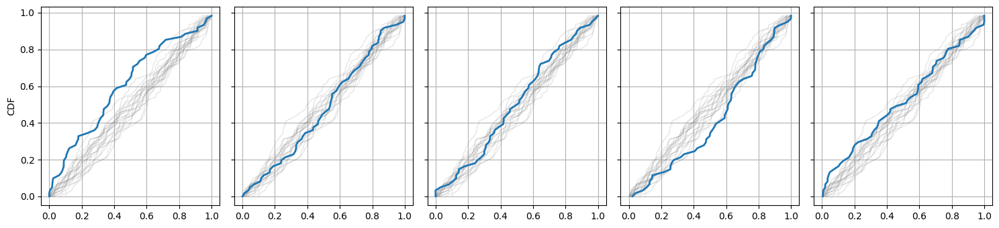


/snle//kmax0.5-kmin0.001-logit-standardize/ens10/
ss shape :  (91, 5, 4)


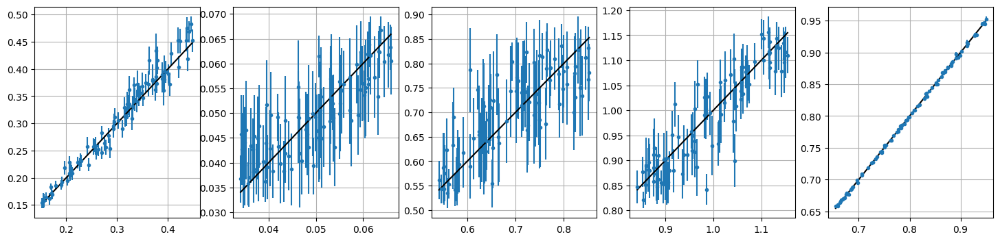

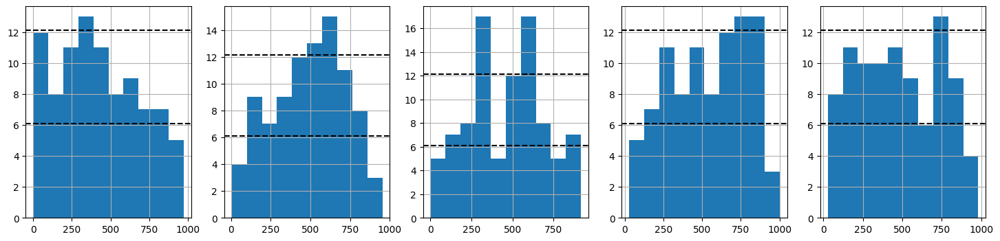

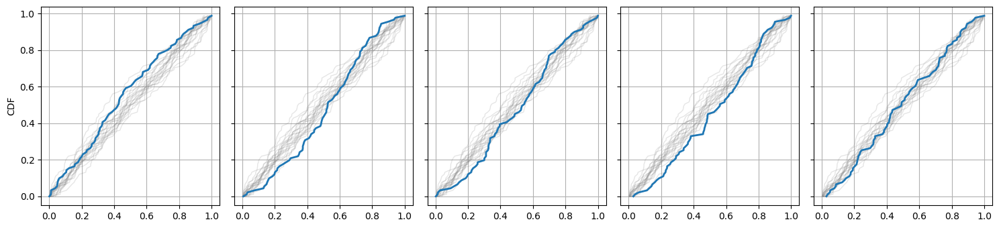


/snle_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10
ss shape :  (43, 5, 4)


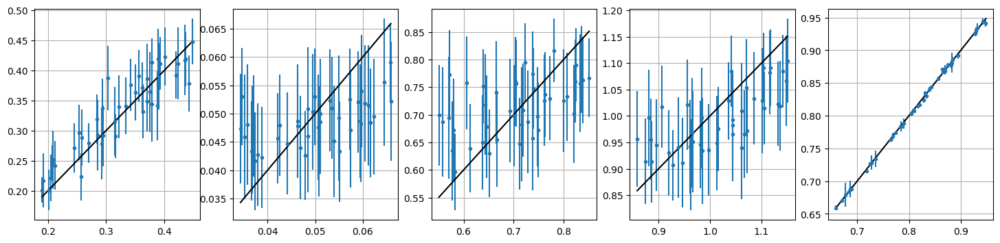

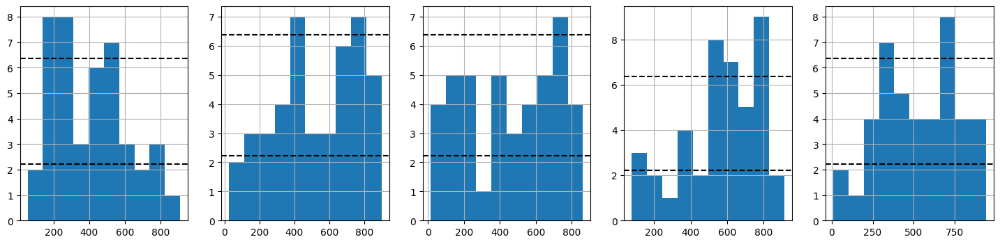

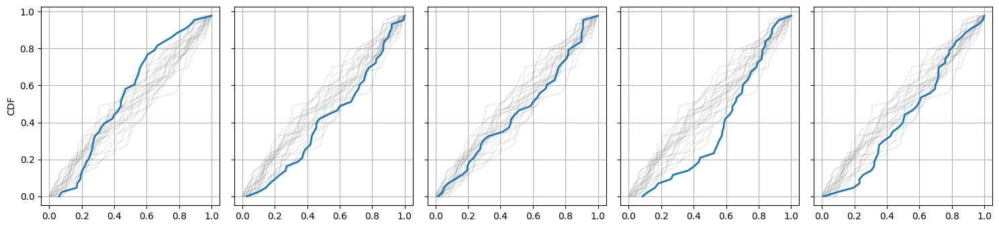


/hybrid2/kmax0.5-kmin0.001-ksplit0.15-nsubs1-splits1-standardize-standardize_cond/ens10
ss shape :  (82, 5, 4)


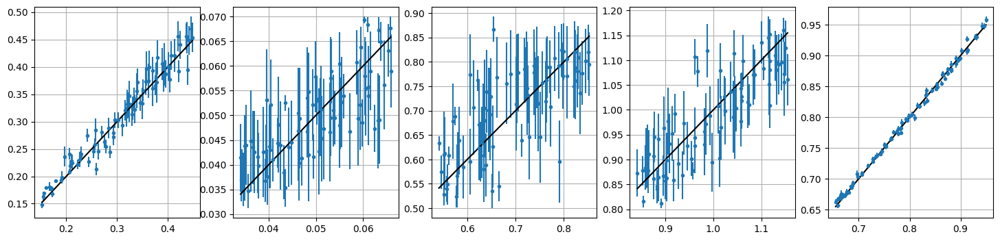

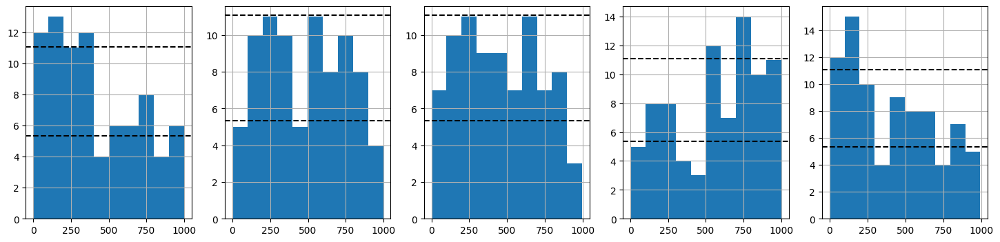

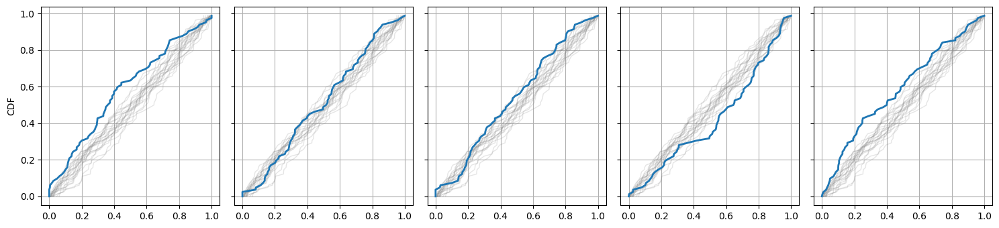


/hybrid2/kmax0.5-kmin0.001-ksplit0.15-nsubs1-splits2-standardize-standardize_cond/ens10
ss shape :  (93, 5, 4)


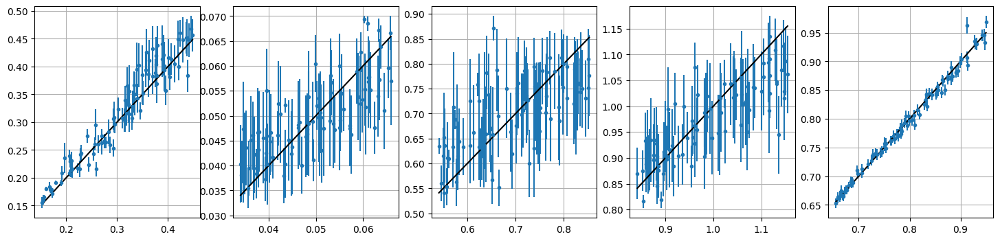

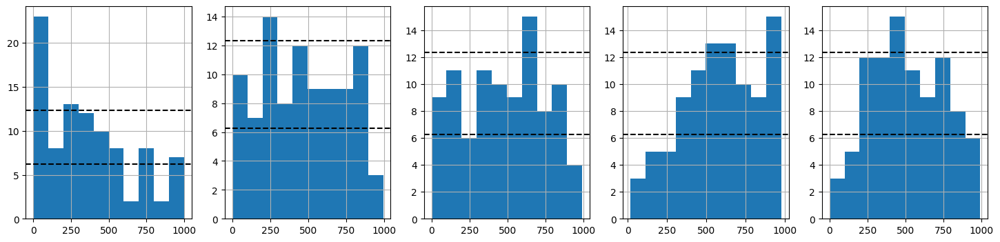

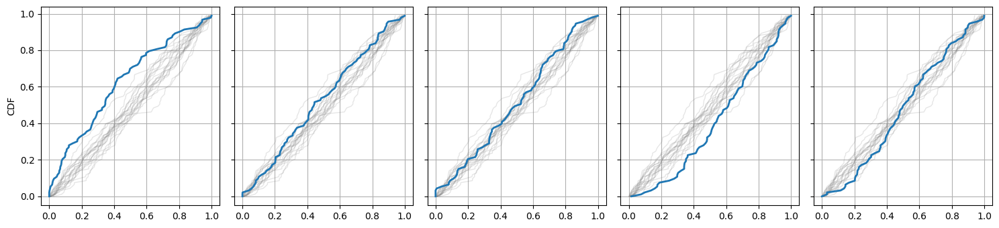


/hybrid2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs2-splits2-standardize-standardize_cond/ens10
ss shape :  (92, 5, 4)


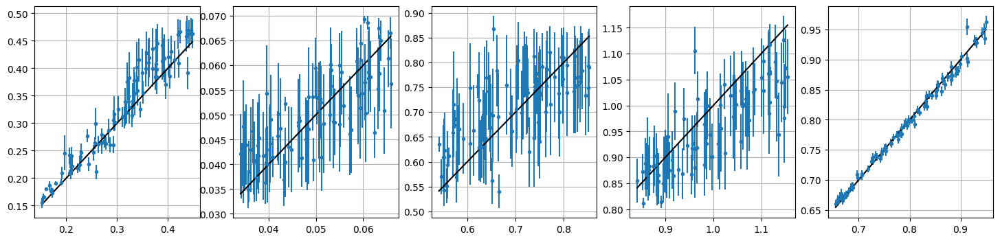

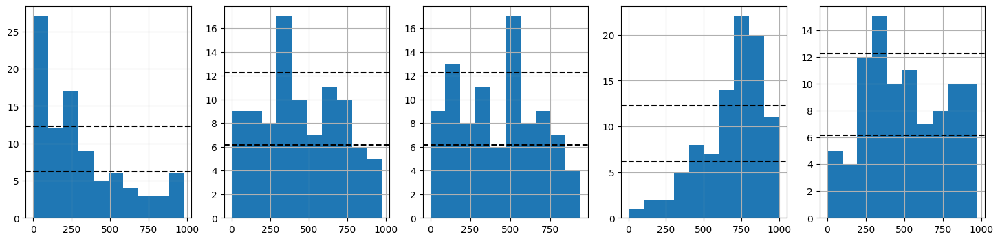

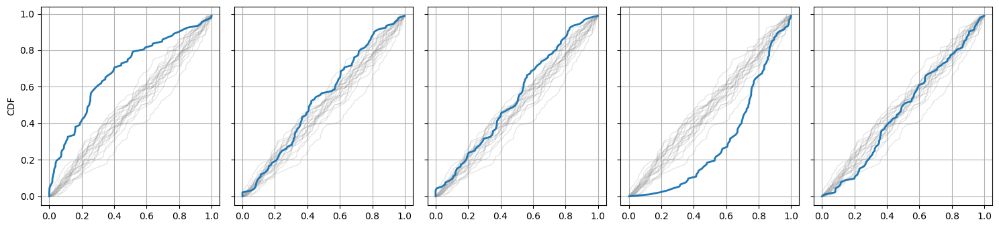


/hybrid2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond/ens10
ss shape :  (87, 5, 4)


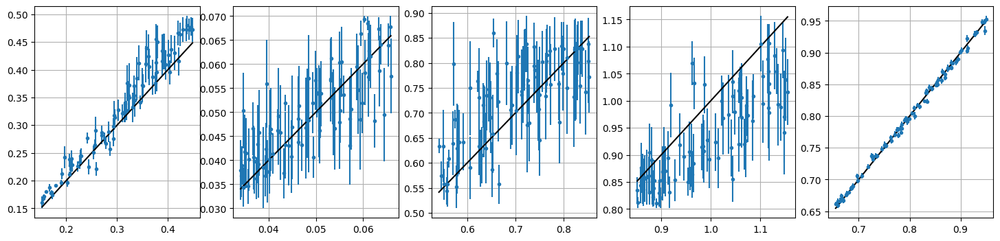

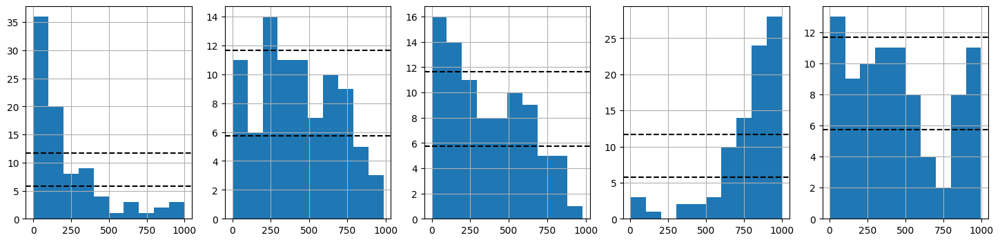

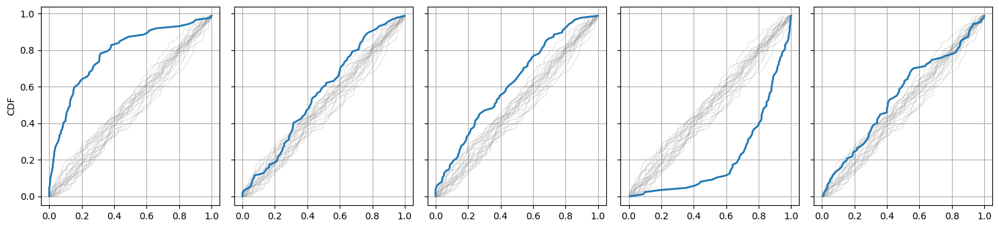


/hybrid2/kmax0.5-kmin0.001-ksplit0.1-meanf-nsubs8-splits2-standardize-standardize_cond/ens5
ss shape :  (83, 5, 4)


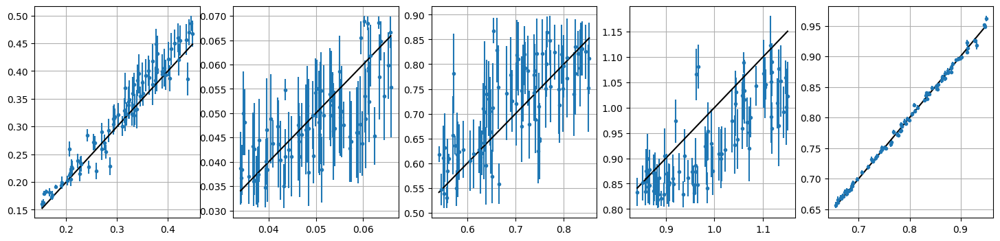

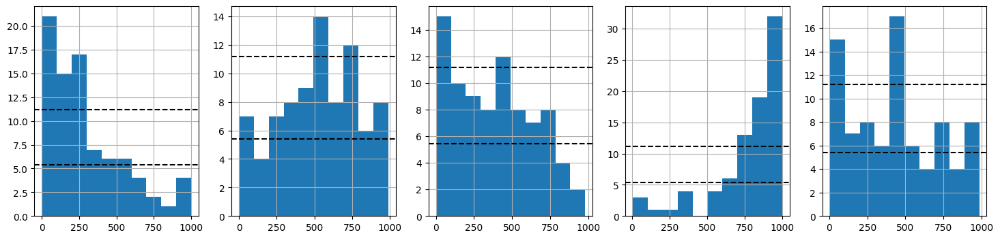

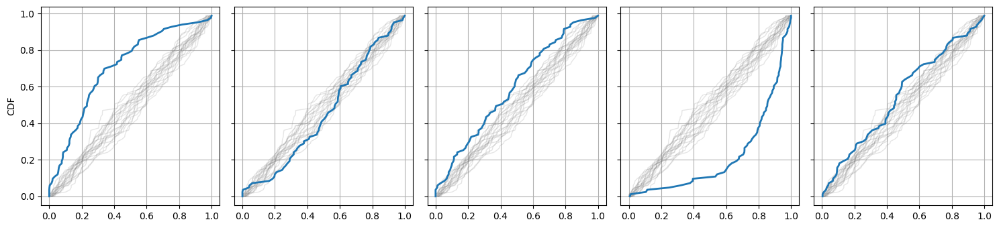


/hybrid2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-sym/ens10
ss shape :  (83, 5, 4)


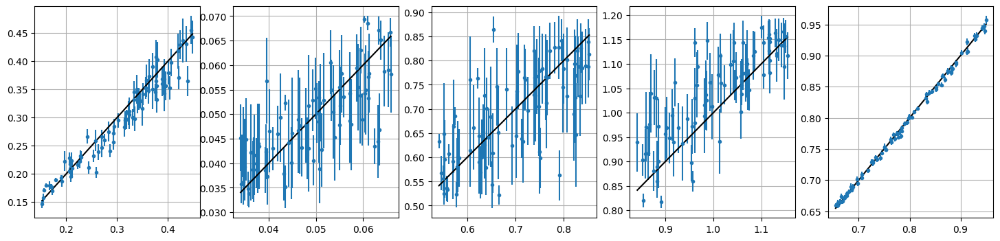

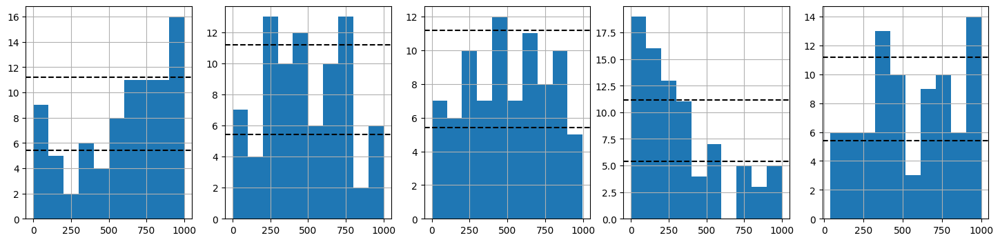

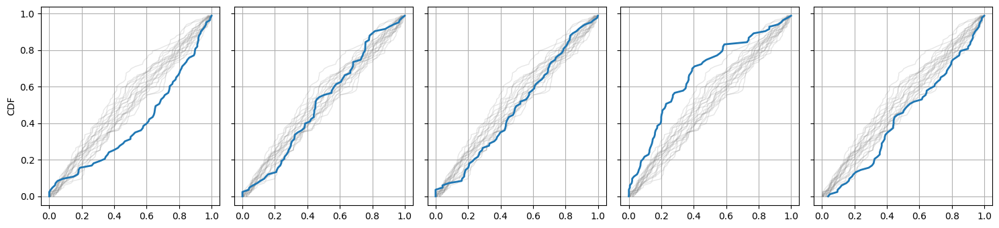


/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10
ss shape :  (90, 5, 4)


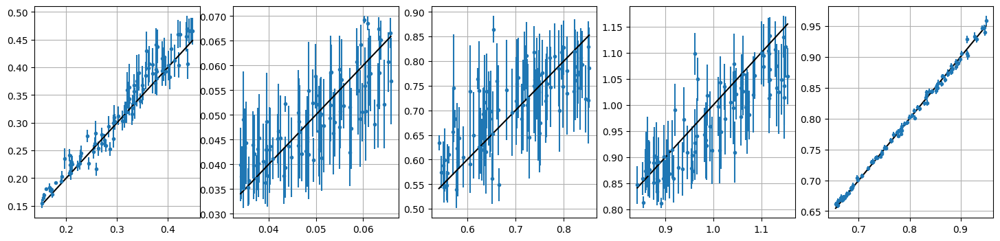

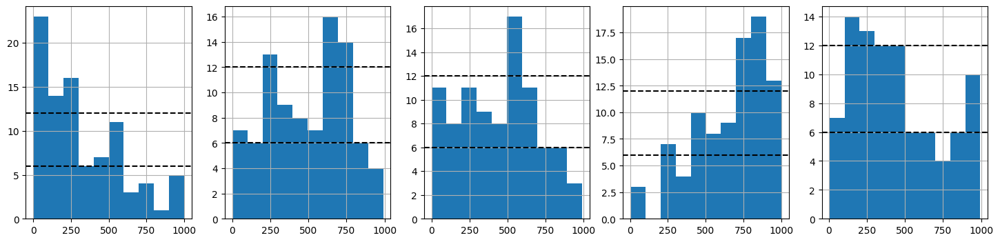

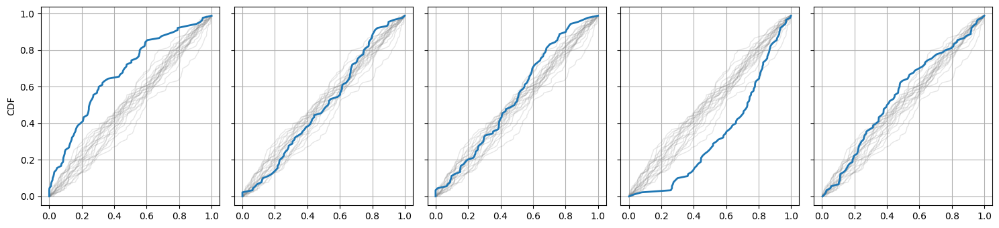


/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs4-splits2-standardize-standardize_cond-style-deconv/ens10
ss shape :  (90, 5, 4)


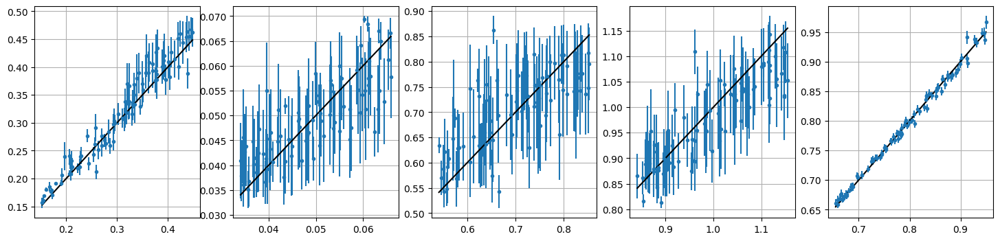

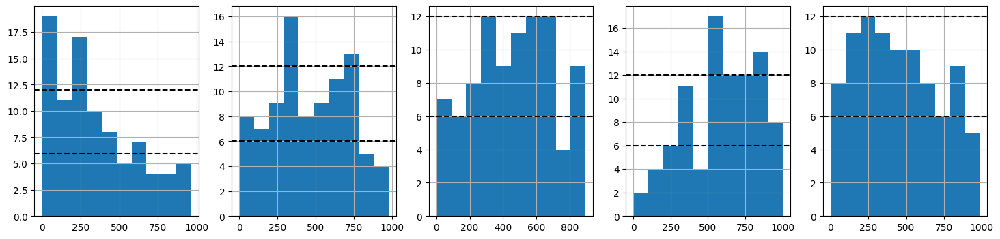

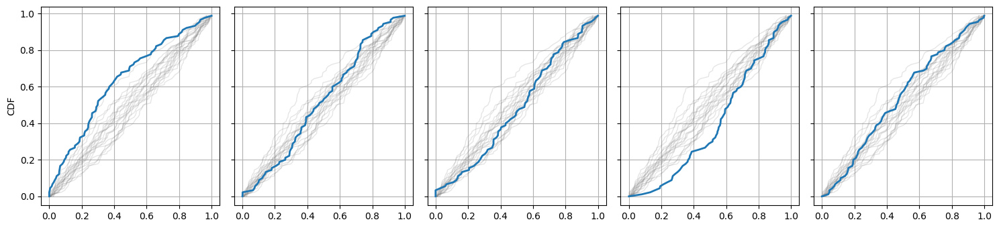


/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs1-splits2-standardize-standardize_cond-style-deconv/ens10
ss shape :  (92, 5, 4)


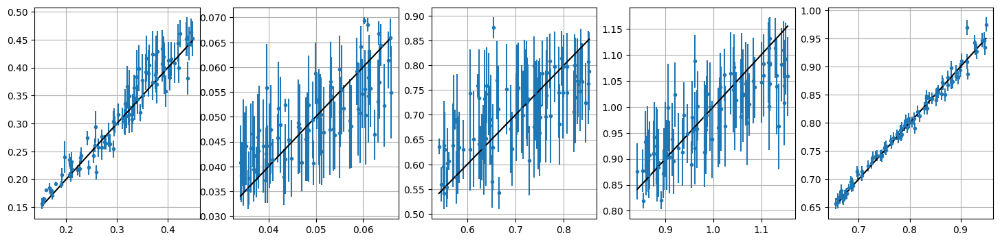

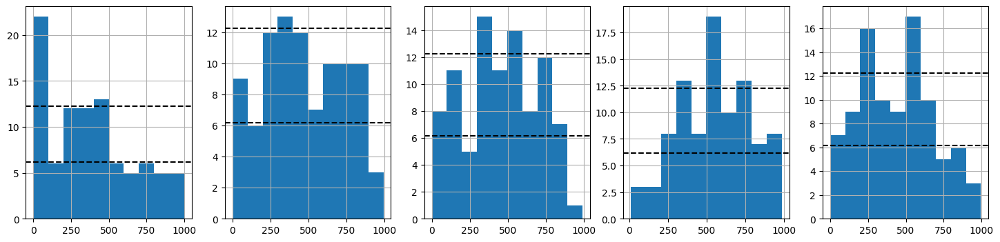

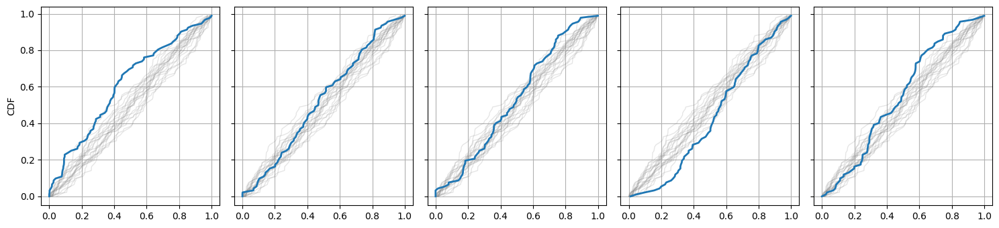


/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-logit-logit_cond-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10
ss shape :  (91, 5, 4)


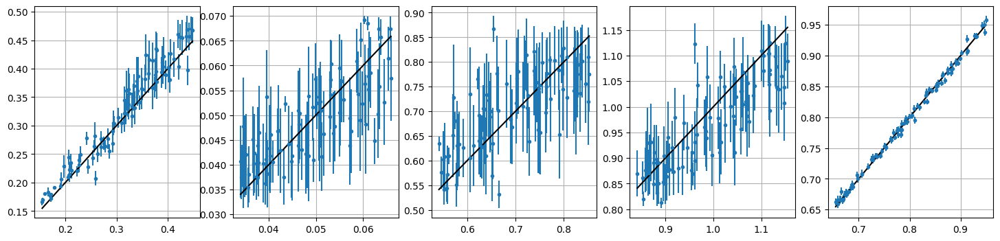

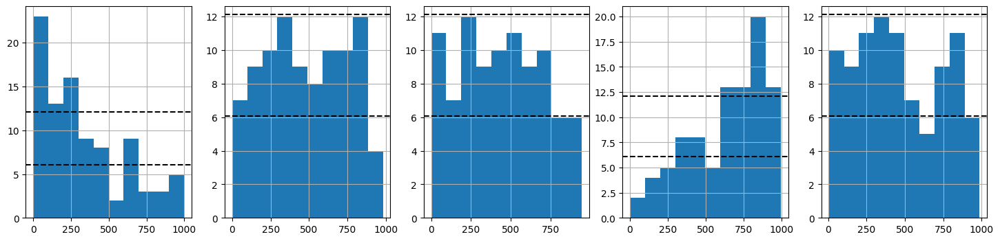

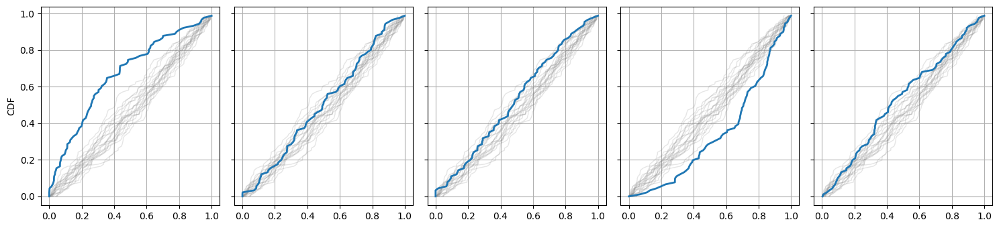


/hybrid2_small_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10
ss shape :  (73, 5, 4)


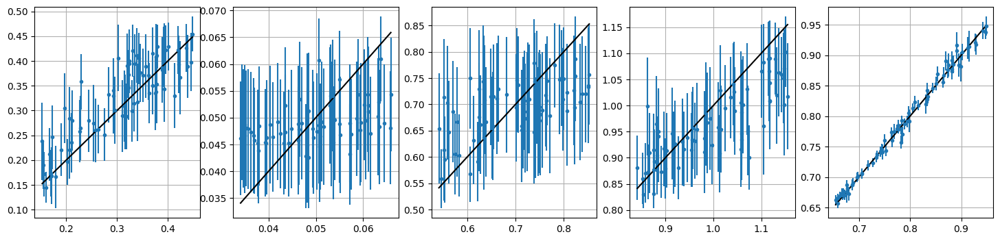

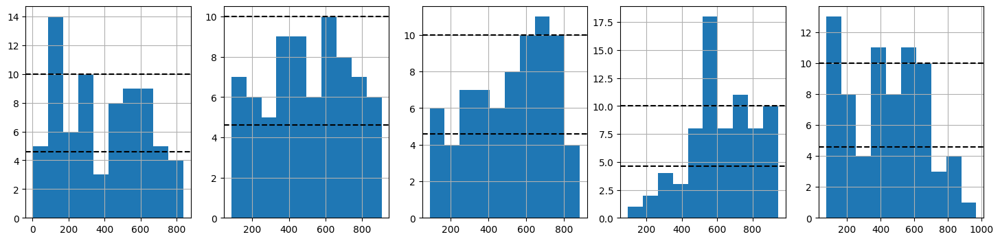

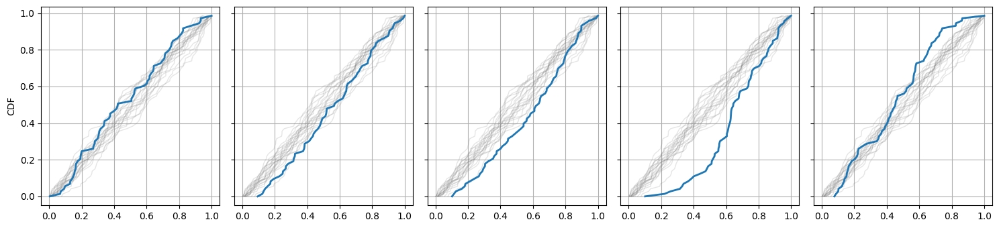


/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.1-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20
ss shape :  (91, 5, 4)


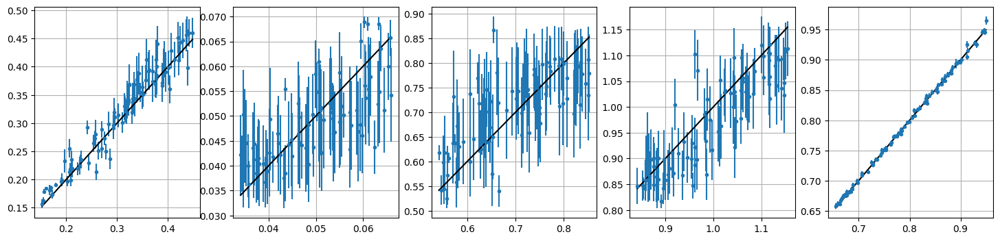

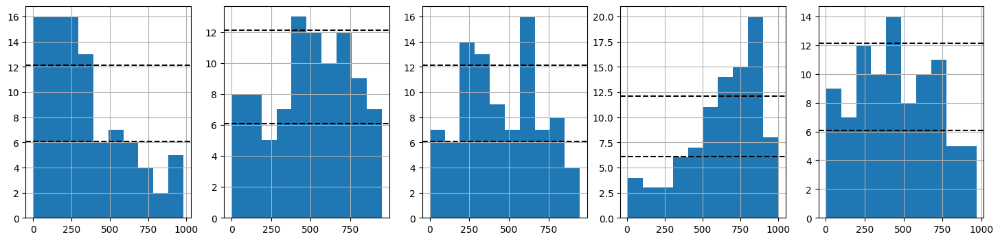

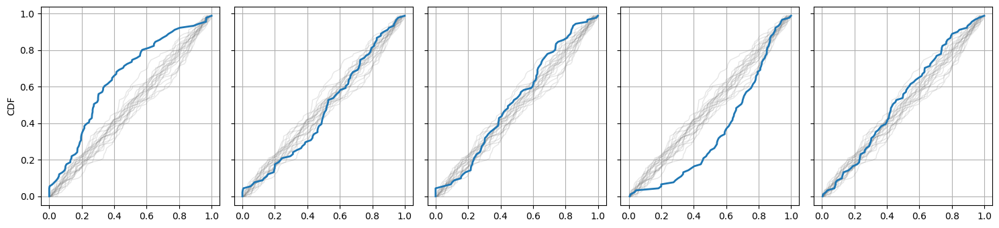


/hybrid2_indep_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10
ss shape :  (90, 5, 4)


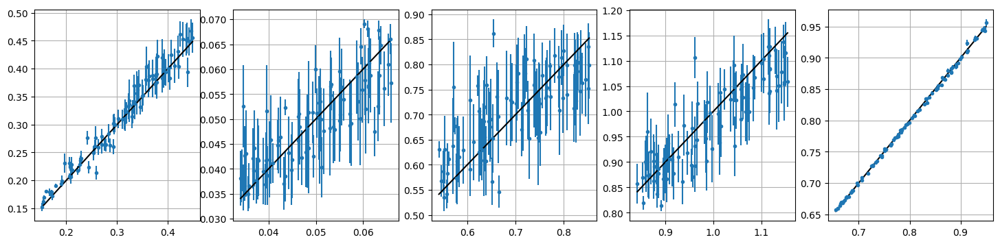

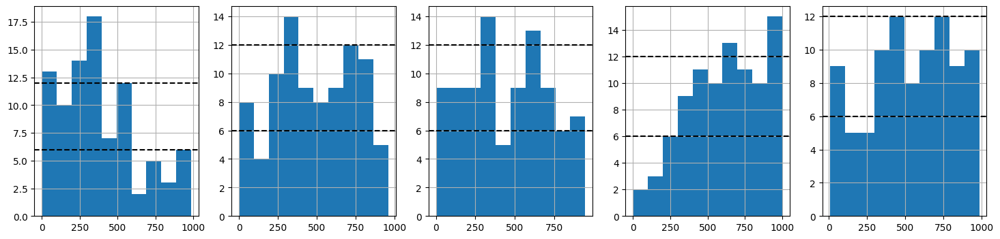

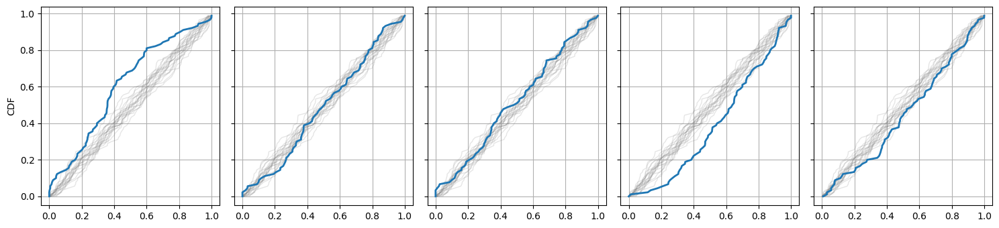


/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10_varycov
ss shape :  (85, 5, 4)


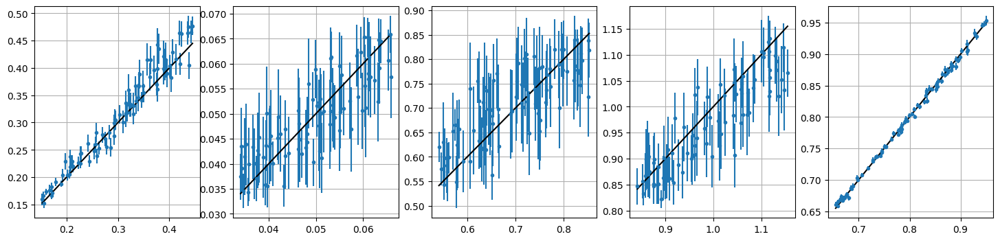

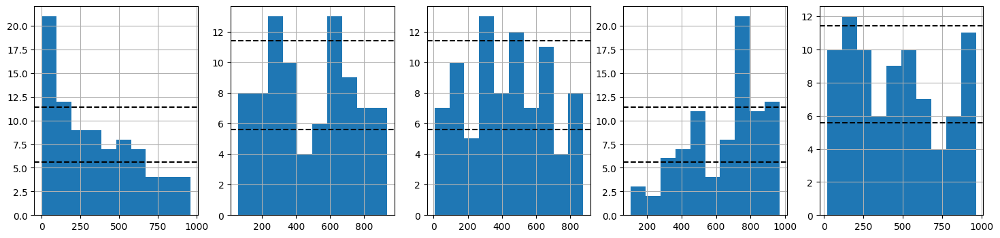

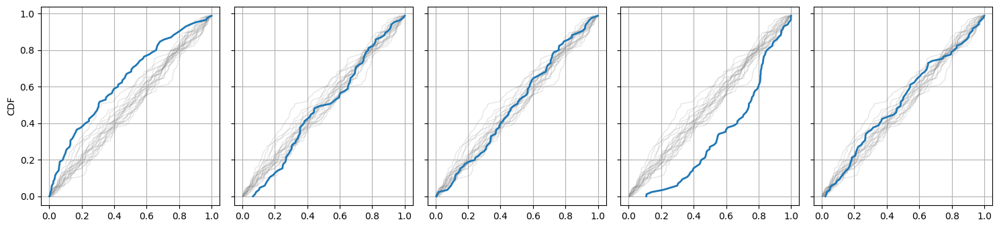


/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20_varycov
ss shape :  (86, 5, 4)


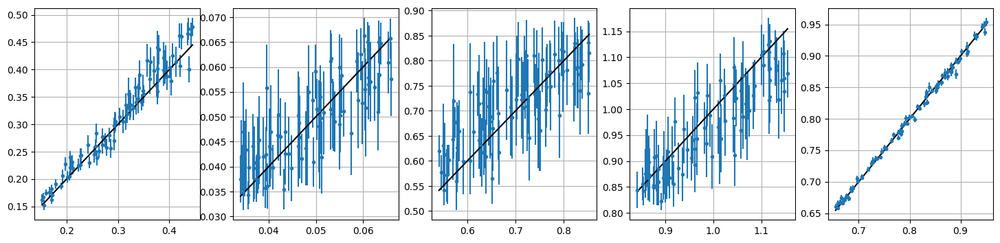

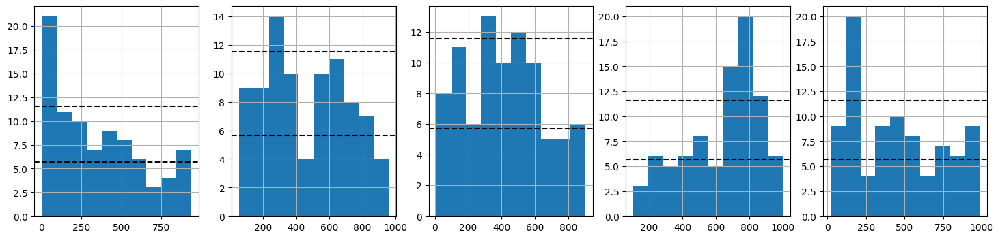

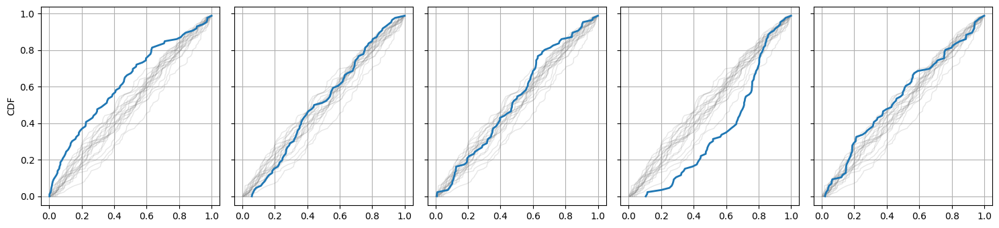


/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs4-splits2-standardize-standardize_cond-style-deconv/ens20_varycov
ss shape :  (86, 5, 4)


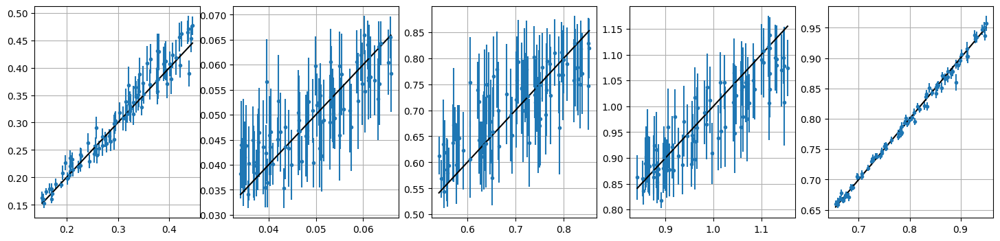

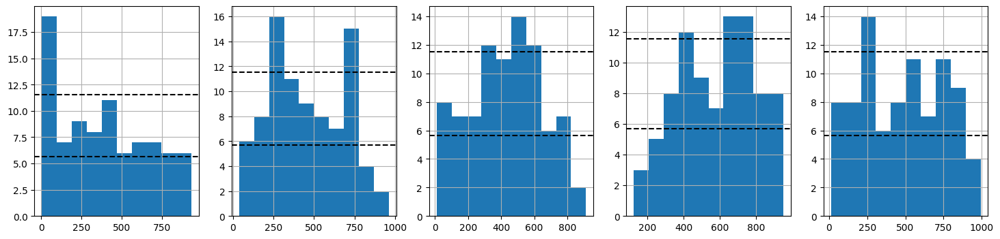

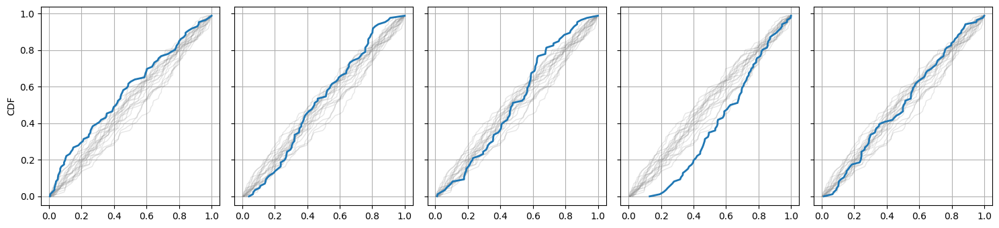


/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs1-splits2-standardize-standardize_cond-style-deconv/ens20_varycov
ss shape :  (86, 5, 4)


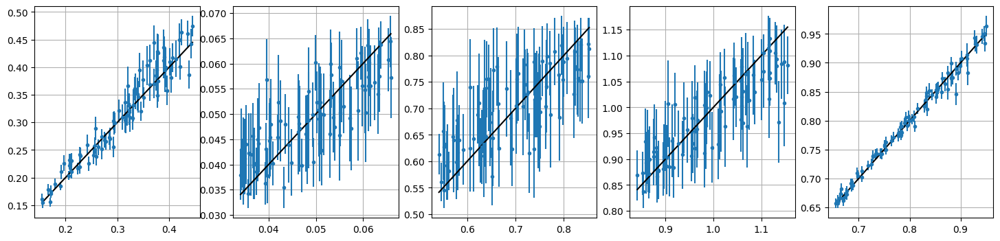

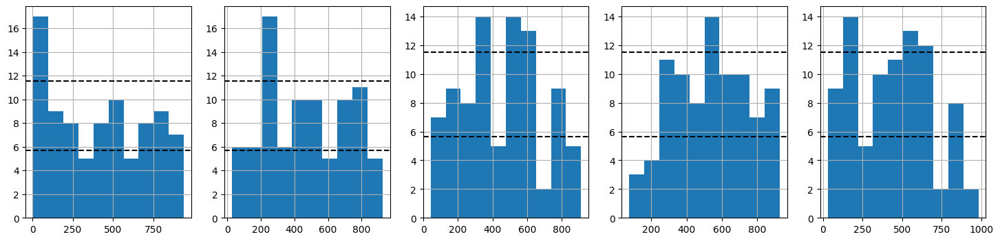

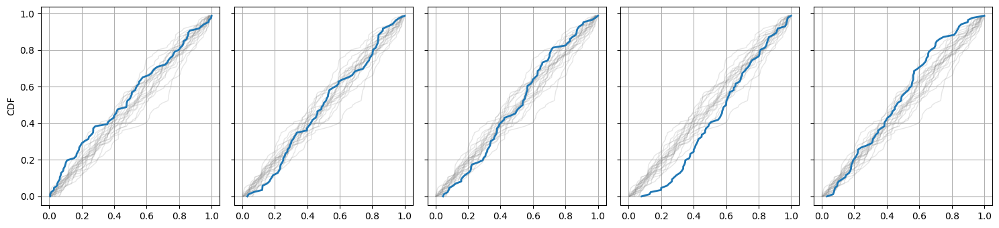


/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.1-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10_varycov
ss shape :  (85, 5, 4)


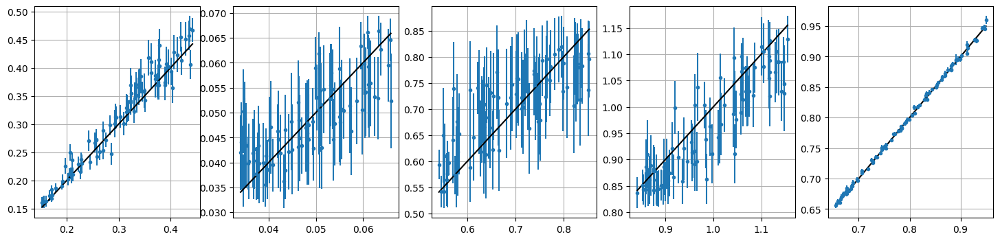

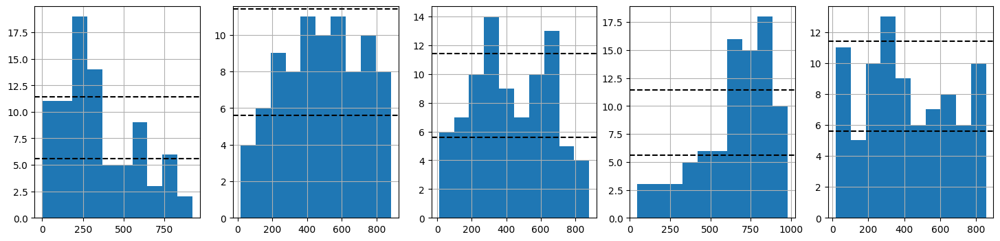

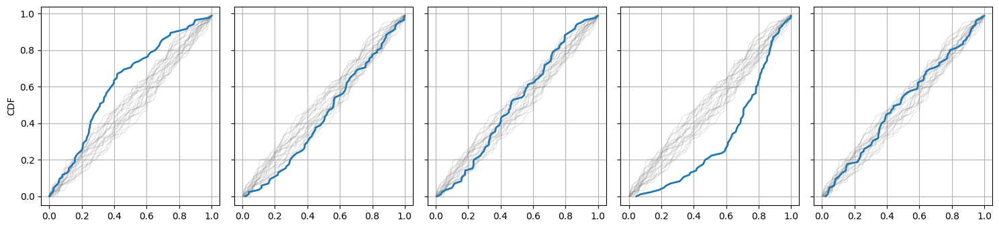


/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.1-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20_varycov
ss shape :  (87, 5, 4)


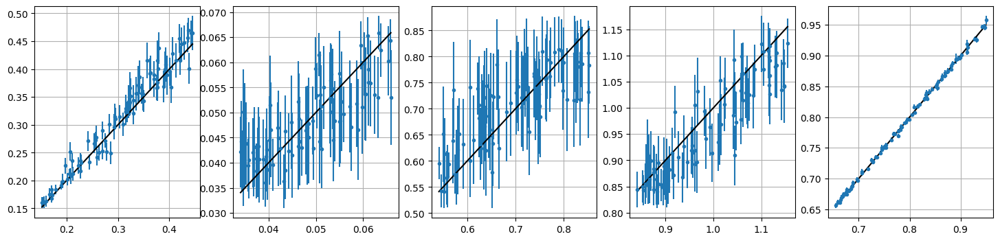

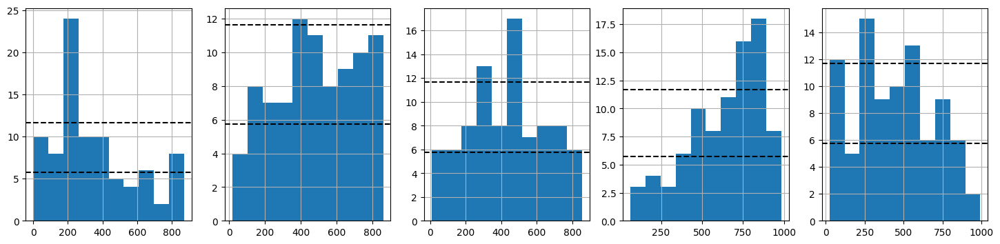

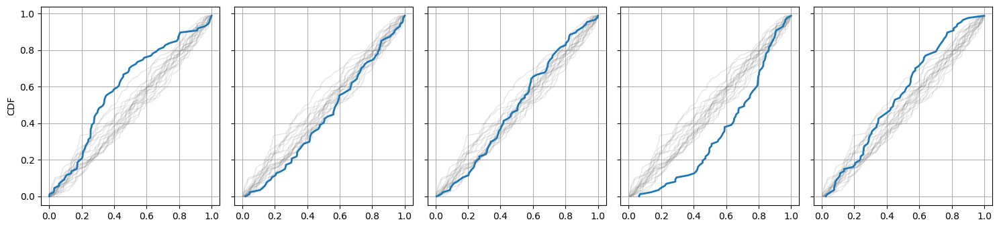


samples/hybrid2/J3-M3-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs8-splits2-standardize-standardize_cond/ens10_varycov
ss shape :  (87, 5, 4)


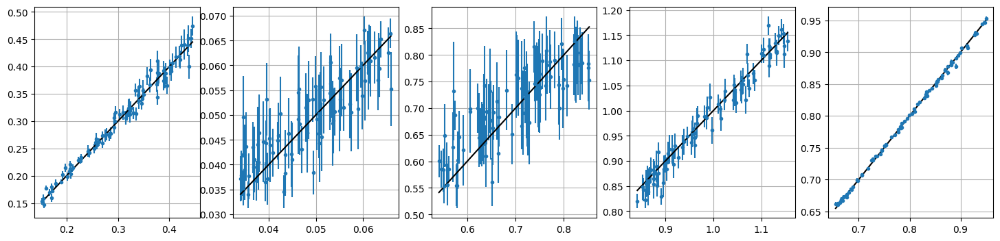

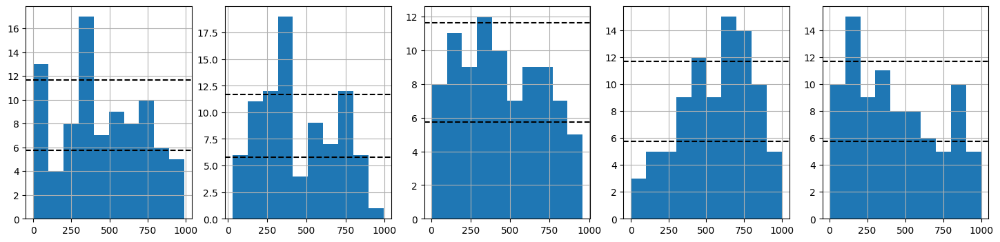

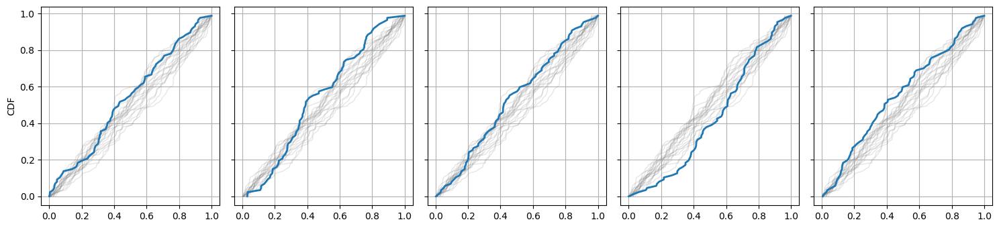


samples/hybrid2/J3-M3-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs1-splits2-standardize-standardize_cond/ens10_varycov
ss shape :  (91, 5, 4)


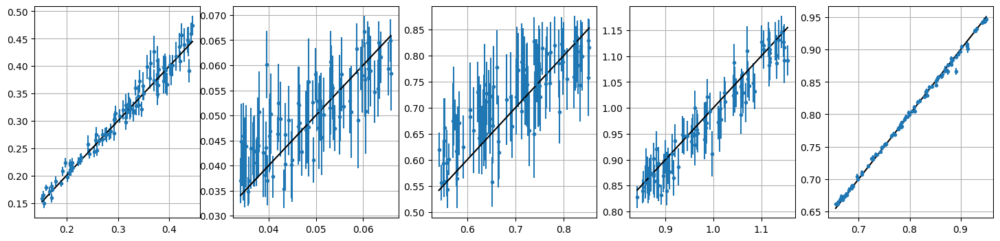

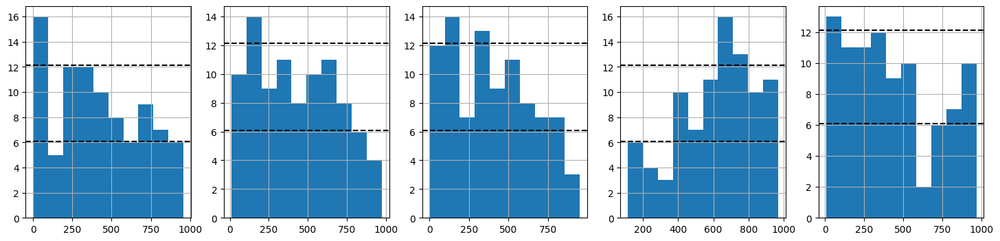

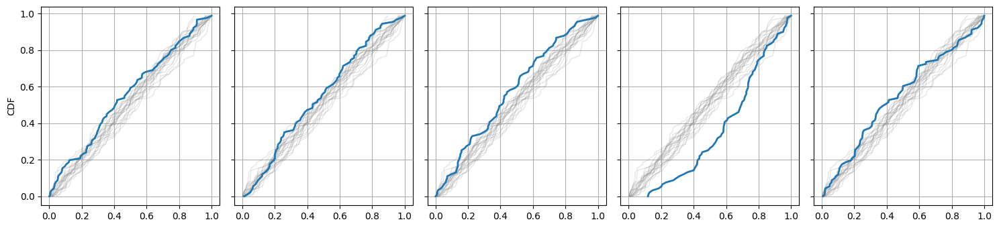


samples/hybrid2/J3-M4-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs8-splits2-standardize-standardize_cond/ens10_varycov
ss shape :  (87, 5, 4)


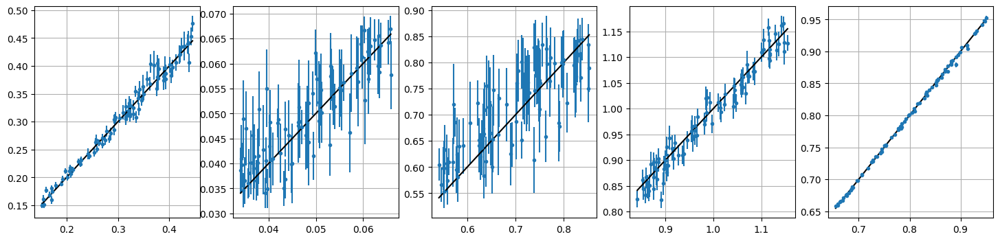

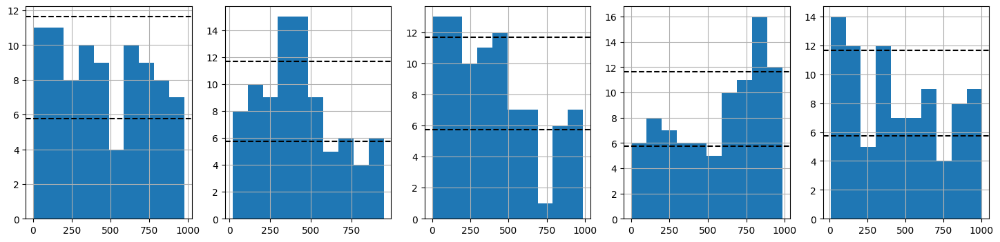

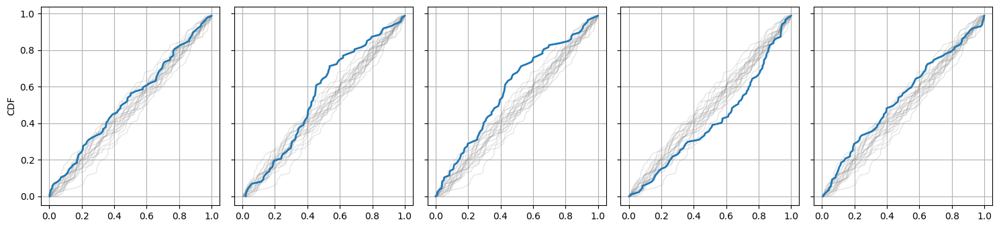

In [12]:
nsims = len(testidx)
nbins = 10
thin = 20

for run in runs[:]:
    print()
    print('/'.join(run.split('/')[8:-1]))
    # if 'splits1' in run: continue
    ss = []
    for i in range(nsims):
        isim = testidx[i]
        # isim = goodids[i]
        if prior_t10[isim]:
        # if True:
            try:
                samples = clean_chains(np.load(run%isim))
                # samples = np.load(run%isim)
                converged = True
                for j in range(5):
                    if ess(samples[..., j].T)/20 < 50 : converged = False
                if not converged:
                    continue
            except Exception as e:
                continue #print(e)
            mu, std = samples.mean(axis=(0, 1)), samples.std(axis=(0, 1))
            ranks = [(samples[::thin, :, j] < params[isim, j]).sum() for j in range(5)]
            ss.append(np.stack([params[isim], mu[:5], std[:5], ranks]).T)
            

    ss = np.array(ss)
    print("ss shape : ", ss.shape)
    if ss.shape[0] == 0:
        print("NO SAMPLES FOUND")
        continue
    fig, ax = plt.subplots(1, 5, figsize=(18, 4))
    for idim in range(5):
        ax[idim].errorbar(ss[:, idim, 0], ss[:, idim, 1], ss[:, idim, 2], fmt='.')
        ax[idim].plot([ss[:, idim, 0].min(), ss[:, idim, 0].max()], [ss[:, idim, 0].min(), ss[:, idim, 0].max()], 'k')
        ax[idim].grid(which='both')
    plt.show()
    

    fig, ax = plt.subplots(1, 5, figsize=(18, 4))
    h = ss.shape[0]/nbins
    for idim in range(5):
        ax[idim].hist(ss[:, idim, 3], bins=nbins)
        ax[idim].axhline(h - h**.5, color='k', ls='--')
        ax[idim].axhline(h + h**.5, color='k', ls='--')
        ax[idim].grid(which='both')
    plt.show()
    
    
        ##################################
    ranks = ss[..., 3]
    ncounts = ss.shape[0]
    npars = 5
    unicov = [np.sort(np.random.uniform(0, 1, ncounts)) for j in range(20)]

    fig, ax = plt.subplots(1, npars, figsize=(npars*3, 3.5), sharex=True, sharey=True)

    for i in range(5):
        xr = np.sort(ranks[:, i])
        xr = xr/xr[-1]
        cdf = np.arange(xr.size)/xr.size
        for j in range(len(unicov)): 
            ax[i].plot(unicov[j], cdf, lw=1, color='gray', alpha=0.2)
        ax[i].plot(xr, cdf, lw=2)
        # ax[i].set_title(titles[i])
        ax[0].set_ylabel('CDF')
        ax[i].grid(which='both')
    plt.tight_layout()
    plt.show()

# Check for a sim

In [13]:
testidx[prior_t10[testidx]].size

94

In [14]:
toplot = [
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/PT/kmax0.15/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/PT_varycov/kmax0.15/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/snpe/kmax0.5-kmin0.001-logit-standardize/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/snle/kmax0.5-kmin0.001-logit-standardize/ens10/LH%d.npy',
        # '/mnt/ceph/users/cmodi/HySBI/matter/samples/snle/kmax0.5-kmin0.15-logit-standardize/LH%d.npy',
    
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2/kmax0.5-kmin0.001-ksplit0.15-nsubs1-splits1-standardize-standardize_cond/ens10/LH%d.npy',
#         '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond/ens10/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs4-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs1-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_indep_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_indep_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10_varycov//LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10_varycov/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs4-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs2-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs1-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.1-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20/LH%d.npy',
        '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.1-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10_varycov/LH%d.npy',
        f'//mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH%d.npy',
        f'//mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2/J3-M3-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs8-splits2-standardize-standardize_cond/ens10_varycov/LH%d.npy',
        # f'//mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2/J3-M3-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs1-splits2-standardize-standardize_cond/ens10_varycov/LH%d.npy',
        f'//mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2/J3-M4-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs8-splits2-standardize-standardize_cond/ens10_varycov/LH%d.npy',
        f'//mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2/J3-M4-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs4-splits2-standardize-standardize_cond/ens10_varycov/LH%d.npy',
        f'//mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2/J3-M4-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs2-splits2-standardize-standardize_cond/ens10_varycov/LH%d.npy',
        f'//mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2/J3-M4-Q4-e0.02-kc0.67-kmin0.001-ksplit0.15-logit-meanf-nsubs1-splits2-standardize-standardize_cond/ens10_varycov/LH%d.npy',
]

keys = ["PT (kmax=0.15)",
        "PT (kmax=0.15) vcov",
        "SNPE (kmax=0.5)", 
        "SNLE (kmax=0.5)", 
        "HySBI (True)",
        "HySBI (8)",
        "HySBI (4)",
        "HySBI (1)",
        "Independent",
        "Independent vcov",
        "HySBI (8) vcov10",
        "HySBI (8) vcov",
        "HySBI (4) vcov",
        "HySBI (2) vcov",
        "HySBI (1) vcov",
        "HySBI (8) ks0.1",
        "HySBI (8) ks0.1 vcov",
        "HySBI (8) nomean vcov20",
        "Wavelets (8, M3) vcov10",
        # "Wavelets (1, M3) vcov10",
        "Wavelets (8) vcov10",
        "Wavelets (4) vcov10",
        "Wavelets (2) vcov10",
        "Wavelets (1) vcov10",
]



919 [0.2951  0.06155 0.7289  0.9379  0.8947 ]
PT (kmax=0.15)
/PT/kmax0.15/LH%d.npy
PT (kmax=0.15) vcov
/PT_varycov/kmax0.15/LH%d.npy
SNPE (kmax=0.5)
/snpe/kmax0.5-kmin0.001-logit-standardize/LH%d.npy
SNLE (kmax=0.5)
/snle/kmax0.5-kmin0.001-logit-standardize/ens10/LH%d.npy
HySBI (True)
/hybrid2/kmax0.5-kmin0.001-ksplit0.15-nsubs1-splits1-standardize-standardize_cond/ens10/LH%d.npy
HySBI (8)
/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy
HySBI (4)
/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs4-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy
HySBI (1)
/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs1-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy
Independent
/hybrid2_indep_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10/LH%d.npy
Independent vcov
/hybrid2_indep_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10_varycov//LH%d

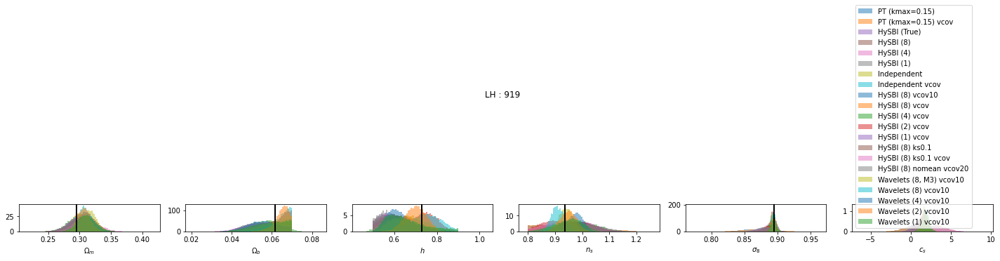

In [15]:
i = 1
isim = testidx[i]
isim = testidx[prior_t20[testidx]][i]
print(isim, params[isim])

samples = {}
# fig, ax = plt.subplots(1, 3, figsize=(20, 3.5))
fig, ax = plt.subplots(1, 6, figsize=(20, 3.5))
 
for ik, fname in enumerate(toplot):
    key = keys[ik]
    print(key)
    print(fname.split('samples')[1])
    try:
        # ss = clean_chains(np.load(key%isim))
        ss = np.load(fname%isim)
        samples[key] = ss
        lbl = None

        j = 0 
        for i in range(ss.shape[-1]):
            # if i in [1, 2, 3]: continue
            if i == 0 :
                lbl = keys[ik]
            ax[j].hist(ss[..., i].flatten(), density=True, bins=50, alpha=0.5, color=f"C{ik}", label=lbl)
            ax[j].set_xlabel(cosmonames[i])
            if i < 5: ax[j].axvline(params[isim, i], color='k')
            j+=1
    except Exception as e:
        print(e)
# ax[0].legend(loc=(0, 1), ncol=2)
ax[-1].legend()
plt.suptitle(f'LH : {isim}')
plt.tight_layout()
plt.show()


PT (kmax=0.15)
PT (kmax=0.15) vcov
SNPE (kmax=0.5)
SNLE (kmax=0.5)
HySBI (True)
HySBI (8)
HySBI (4)
HySBI (1)
Independent
Independent vcov
HySBI (8) vcov10
HySBI (8) vcov
HySBI (4) vcov
HySBI (2) vcov
HySBI (1) vcov
HySBI (8) ks0.1
HySBI (8) ks0.1 vcov
HySBI (8) nomean vcov20
Wavelets (8, M3) vcov10
Wavelets (8) vcov10
Wavelets (4) vcov10
Wavelets (2) vcov10
Wavelets (1) vcov10


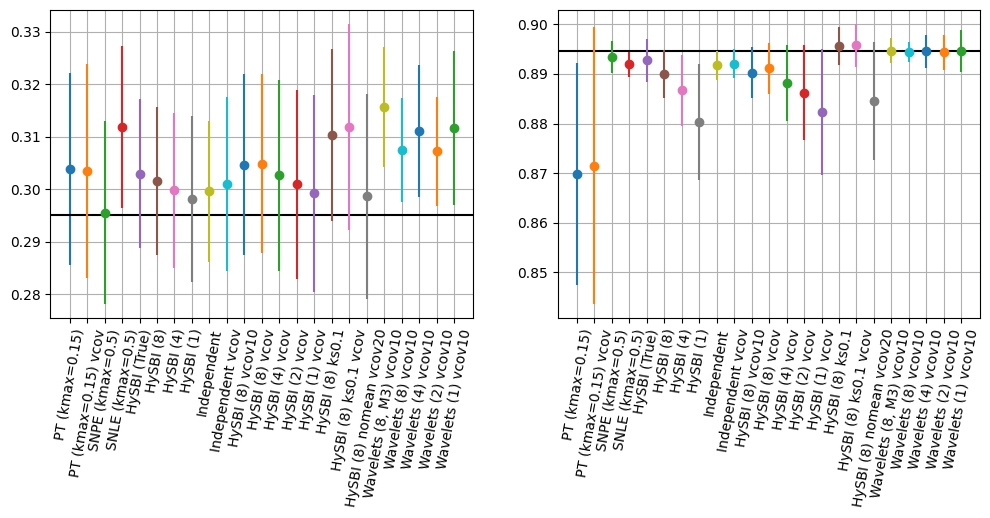

In [18]:
ik = 0 
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

xaxis = []
for key in samples.keys():
    print(key)
    mu, std = samples[key].mean(axis=(0, 1)), samples[key].std(axis=(0, 1))
    j = 0 
    ax[0].errorbar(ik, mu[..., j], std[..., j], marker='o')
    if not ik: ax[0].axhline(params[isim, j], color='k')
    j = 4
    ax[1].errorbar(ik, mu[..., j], std[..., j], marker='o')
    if not ik: ax[1].axhline(params[isim, j], color='k')
    xaxis.append([ik, key])
    ik += 1
    
    
xaxis = np.array(xaxis).T
for axis in ax:
    axis.set_xticks(xaxis[0].astype(float)) 
    axis.set_xticklabels(xaxis[1], rotation=80) 
    axis.grid(which='both')
    # axis.set_xticklabels([1,4,5], fontsize=12)



# for all good sims

In [16]:
allsamples = {}
 
for isim in testidx[prior_t20[testidx]]:
    ss = {}
    
    for ik, fname in enumerate(toplot):
        key = keys[ik]
        try:
            ss[key] = clean_chains(np.load(fname%isim))
            # ss[key] = np.load(fname%isim)
        except Exception as e:
            print(e)
        allsamples[isim] = ss

865
[0.3199  0.04035 0.7235  1.0251  0.8329 ]


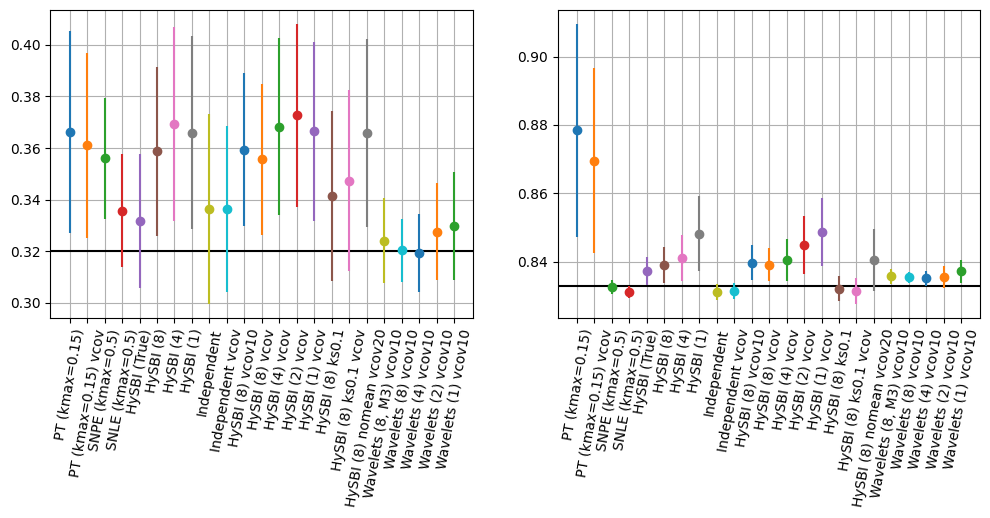

919
[0.2951  0.06155 0.7289  0.9379  0.8947 ]


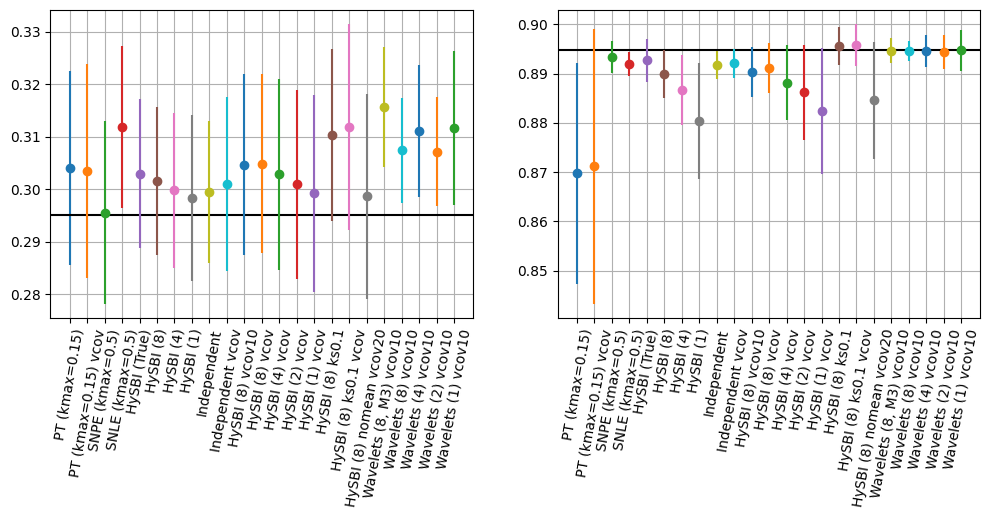

807
[0.3337  0.06123 0.6923  0.9853  0.7847 ]


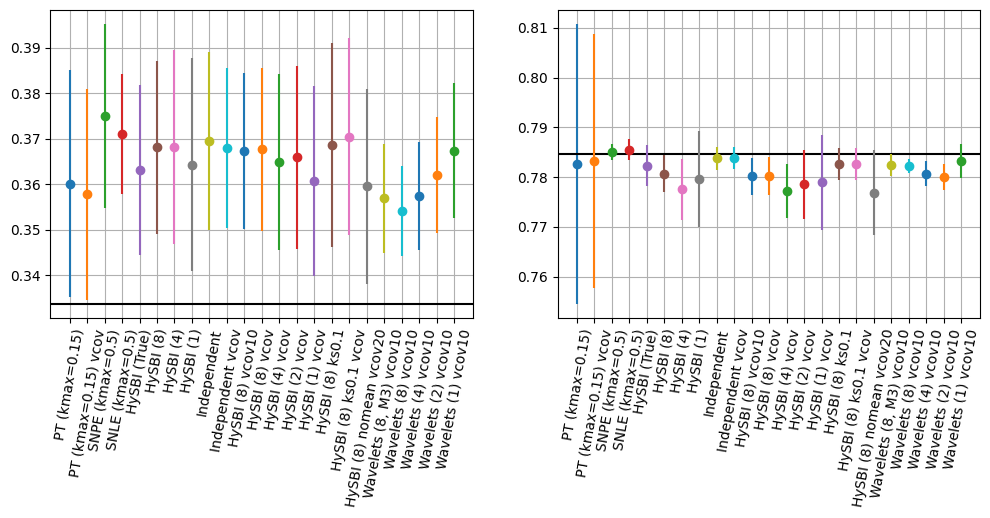

1847
[0.2569  0.05113 0.6467  0.8959  0.8289 ]


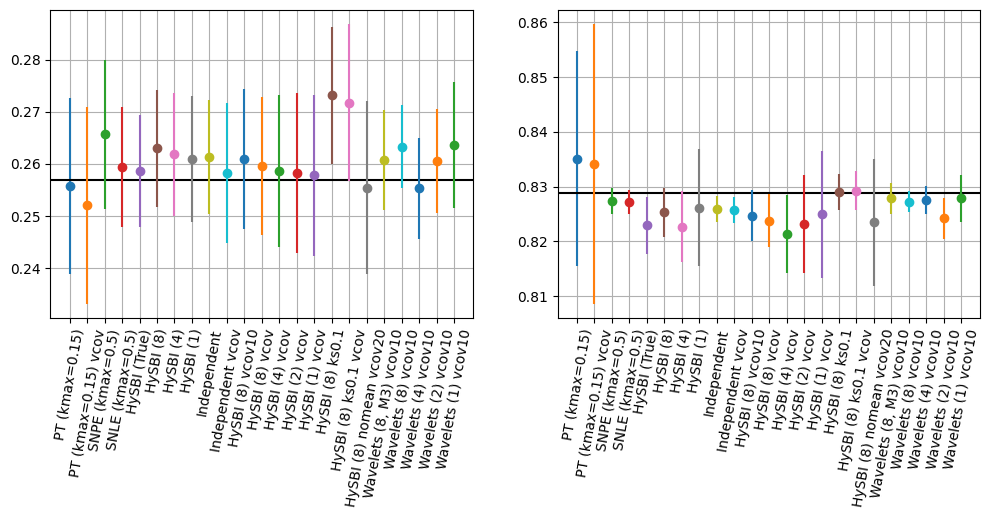

663
[0.3223  0.04625 0.7015  0.9607  0.8311 ]


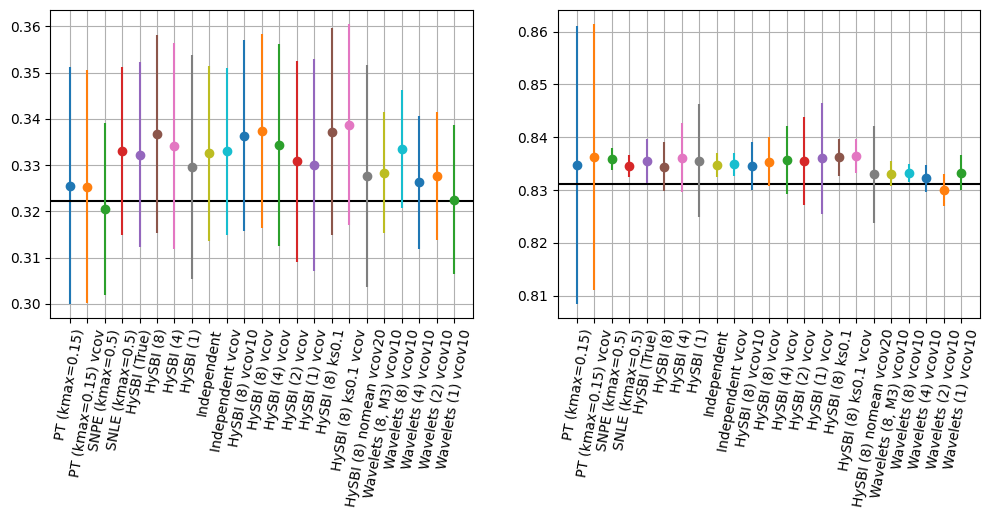

1964
[0.3157  0.05723 0.7491  0.9563  0.8091 ]


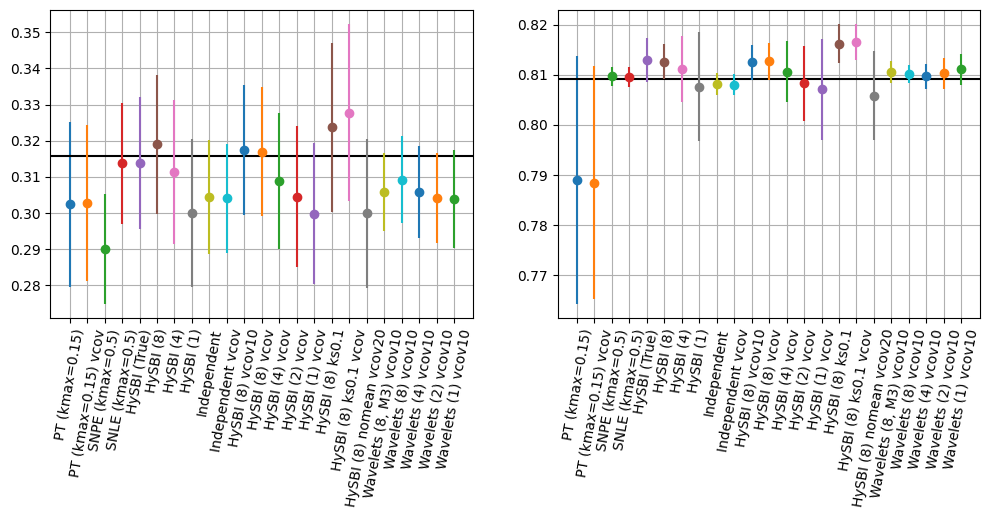

121
[0.2541  0.04943 0.7997  0.9459  0.8819 ]


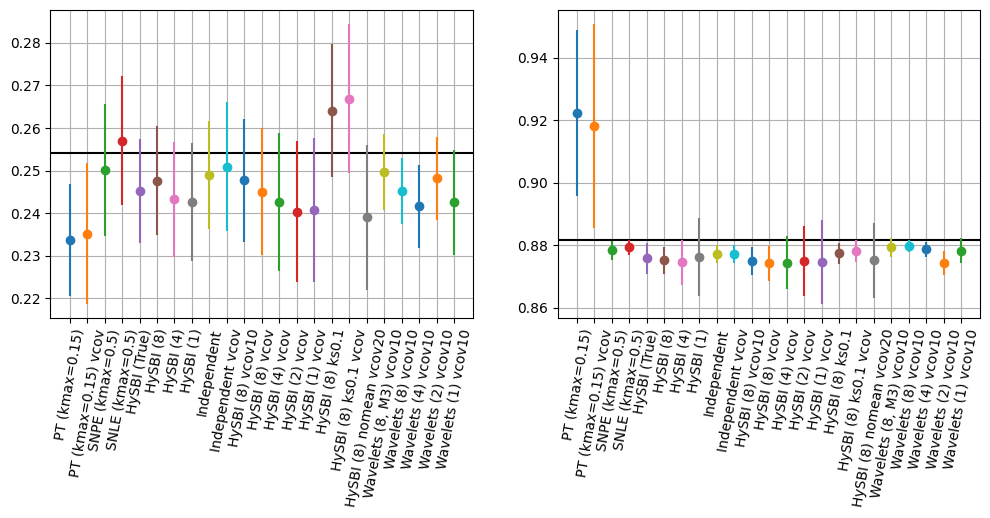

696
[0.2057  0.05959 0.7193  1.0443  0.8343 ]


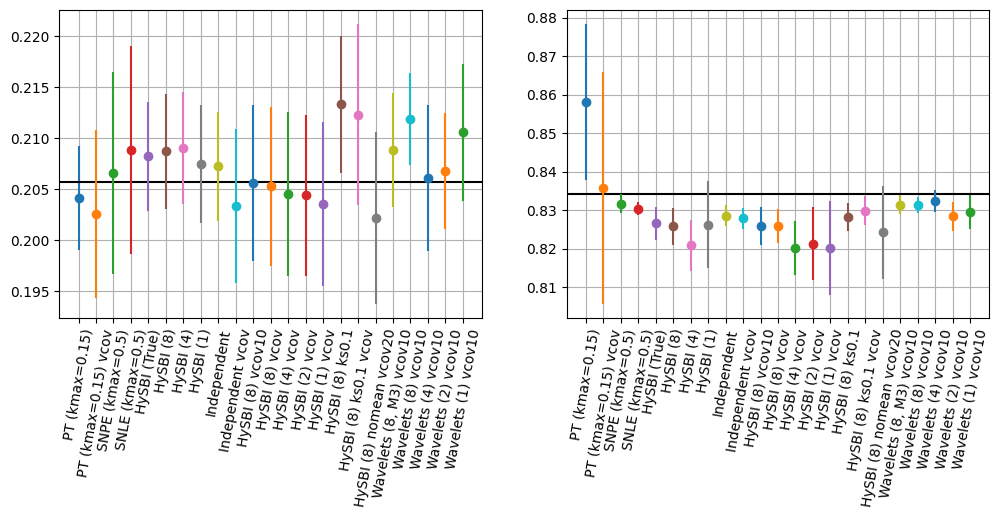

749
[0.2837  0.05101 0.7055  1.0721  0.6887 ]


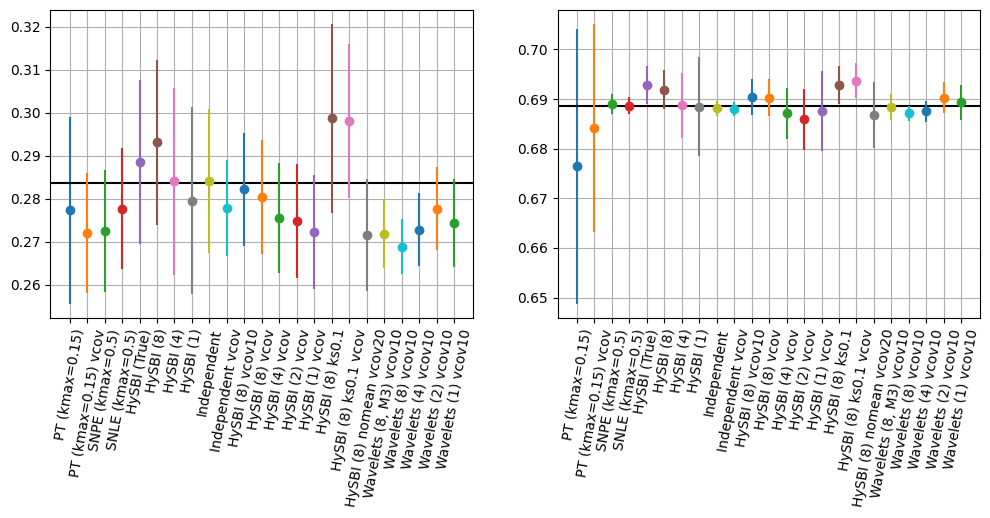

1539
[0.3149  0.05077 0.7161  0.9655  0.8847 ]


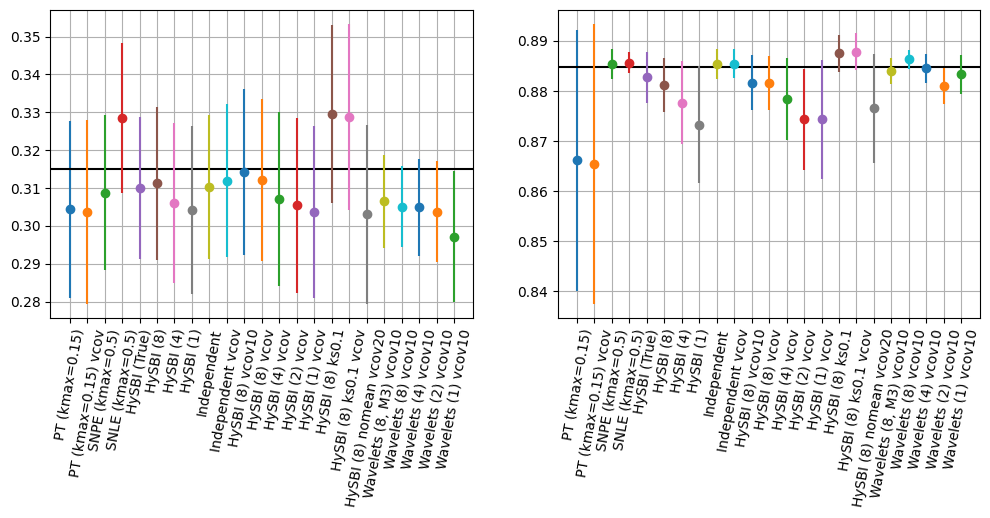

1304
[0.2069  0.04821 0.8071  1.1181  0.8333 ]


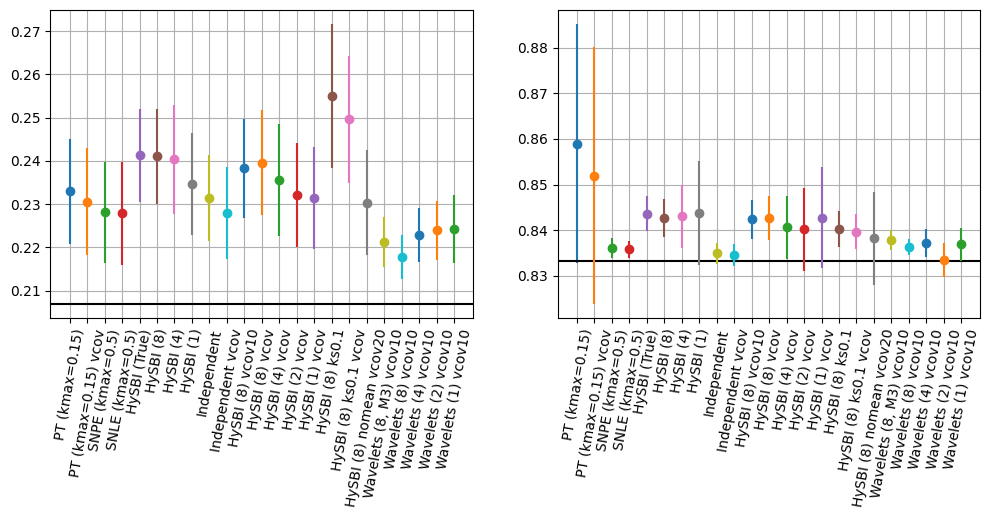

11
[0.4195  0.04627 0.7635  1.0415  0.8047 ]


/tmp/ipykernel_395031/925985479.py:11: RuntimeWarning: Mean of empty slice.
  mu, std = samples[key].mean(axis=(0, 1)), samples[key].std(axis=(0, 1))
/mnt/home/cmodi/miniconda3/envs/ptorch/lib/python3.8/site-packages/numpy/core/_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/mnt/home/cmodi/miniconda3/envs/ptorch/lib/python3.8/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/mnt/home/cmodi/miniconda3/envs/ptorch/lib/python3.8/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/mnt/home/cmodi/miniconda3/envs/ptorch/lib/python3.8/site-packages/numpy/core/_methods.py:258: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/mnt/home/cmodi/miniconda3/envs/ptorch/lib/python3.8/site-packages/matplotlib/axes/_base.py:2503: User

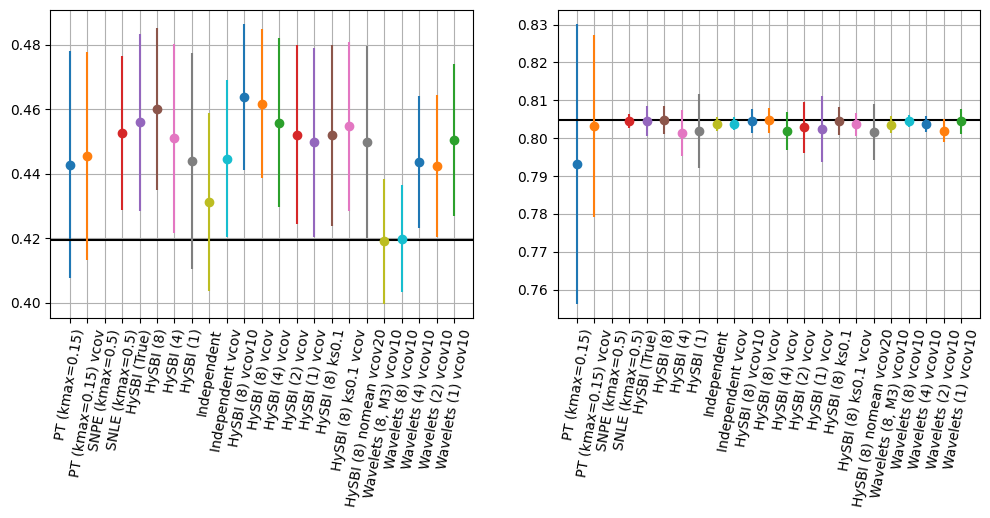

872
[0.3505  0.05315 0.5831  0.9271  0.7185 ]


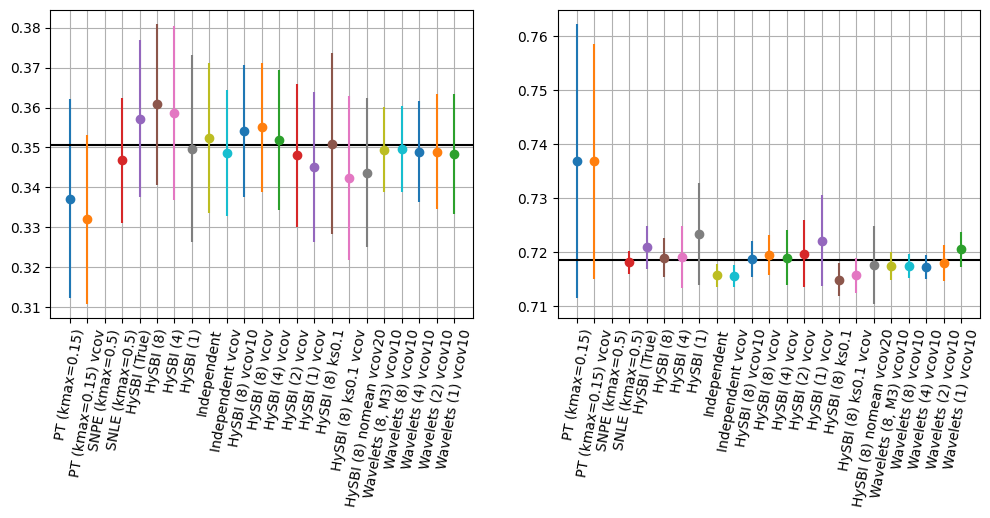

594
[0.3699  0.06049 0.6133  1.0131  0.7689 ]


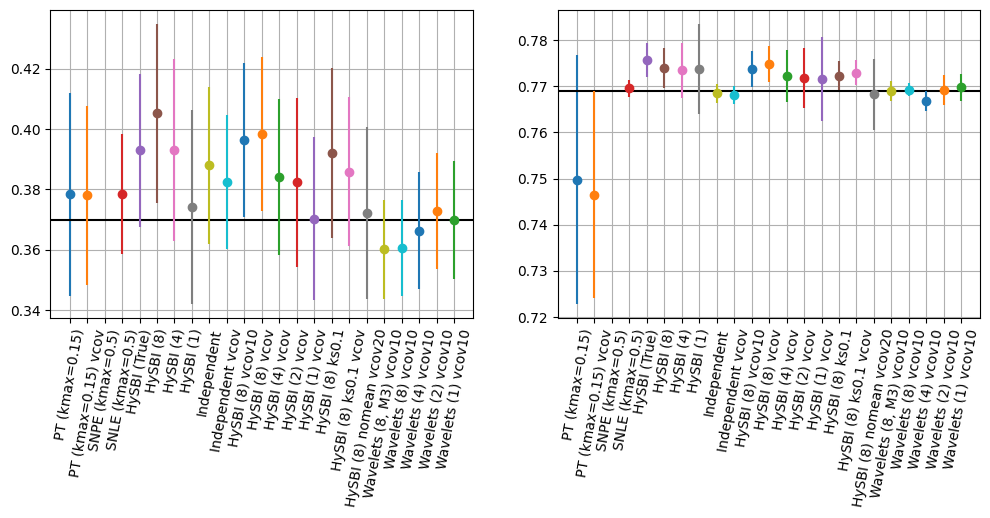

1630
[0.3703  0.04851 0.7385  0.9839  0.6873 ]


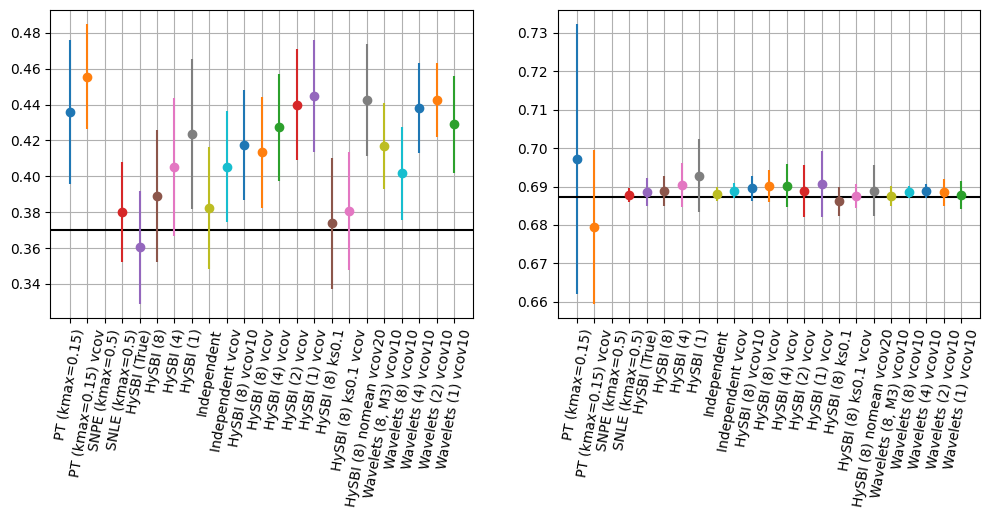

1329
[0.3403  0.05119 0.7409  0.9357  0.8915 ]


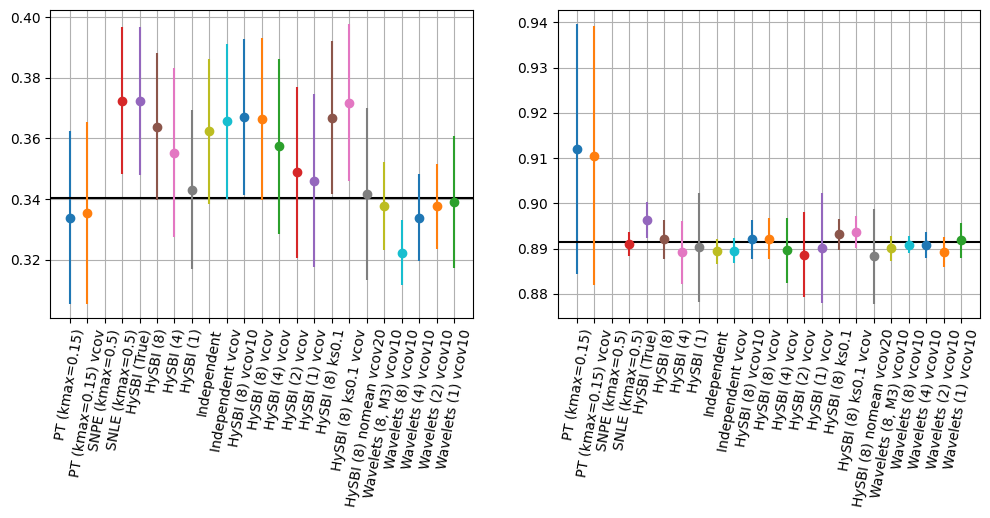

909
[0.3349  0.04321 0.7655  1.0095  0.7535 ]


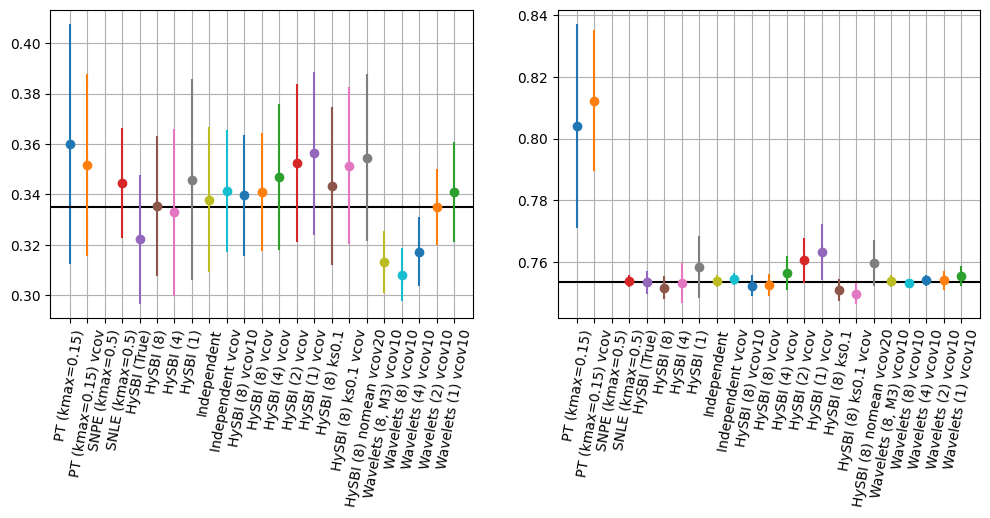

964
[0.3151  0.04039 0.6893  0.9023  0.7923 ]


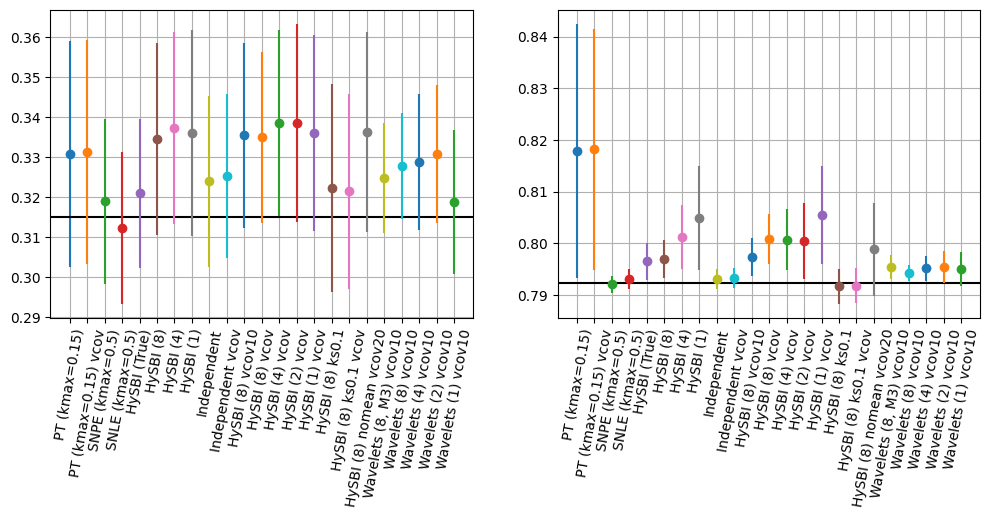

84
[0.3185  0.06115 0.6531  0.9139  0.6865 ]


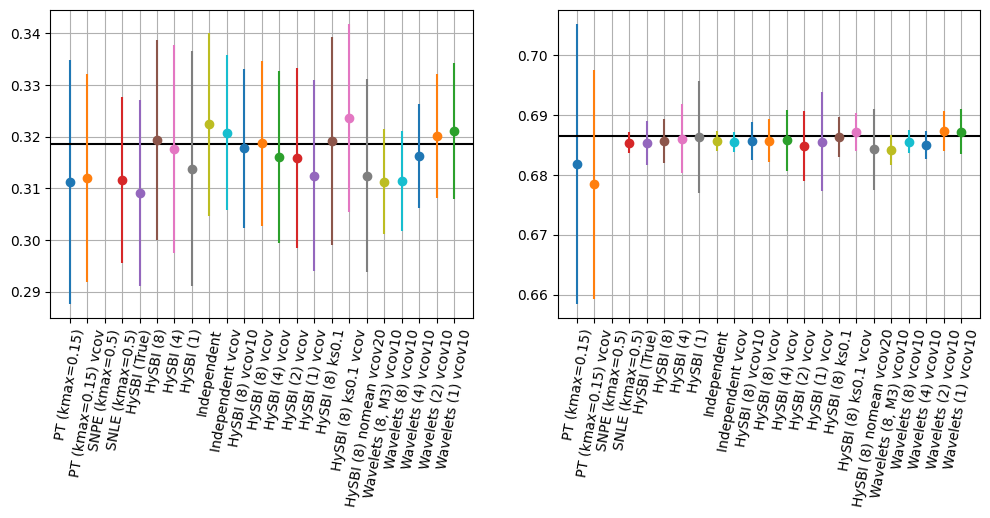

908
[0.2273  0.05021 0.7261  1.1175  0.9017 ]


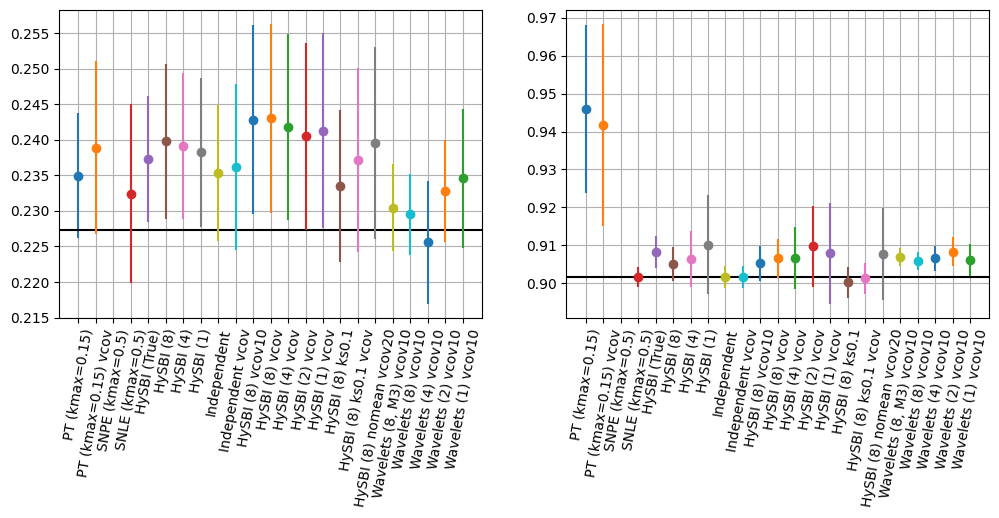

1289
[0.4059  0.05551 0.5803  0.9617  0.7511 ]


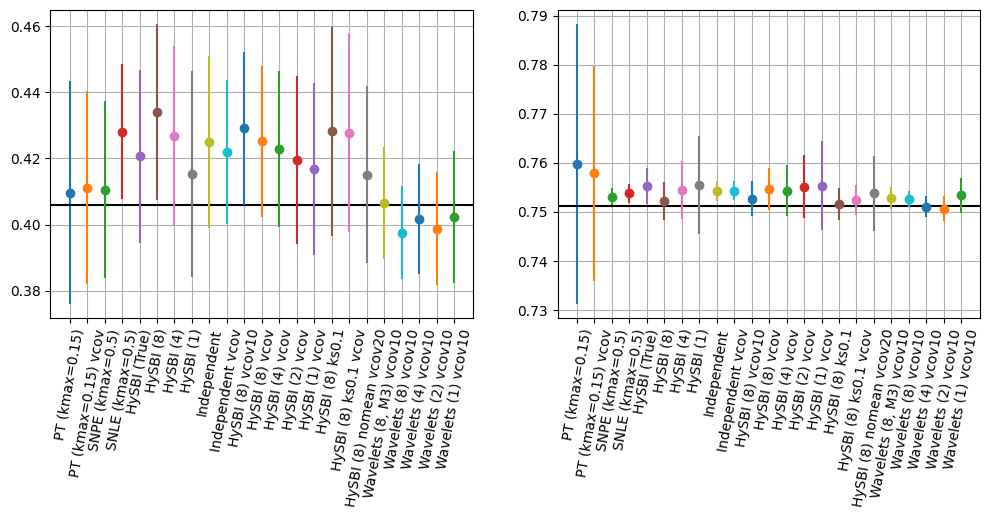

115
[0.3097  0.04639 0.6339  0.8969  0.8993 ]


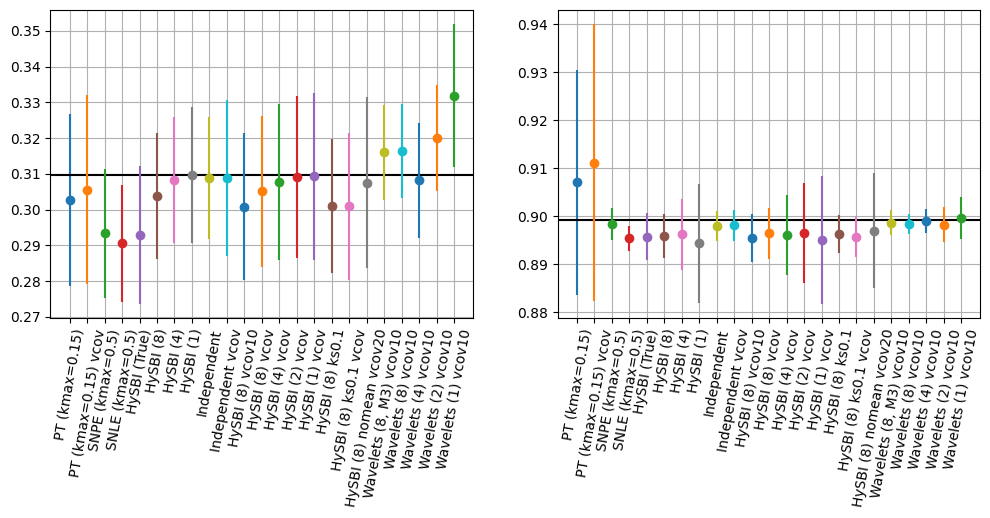

87
[0.2289  0.03937 0.7179  1.0747  0.7849 ]


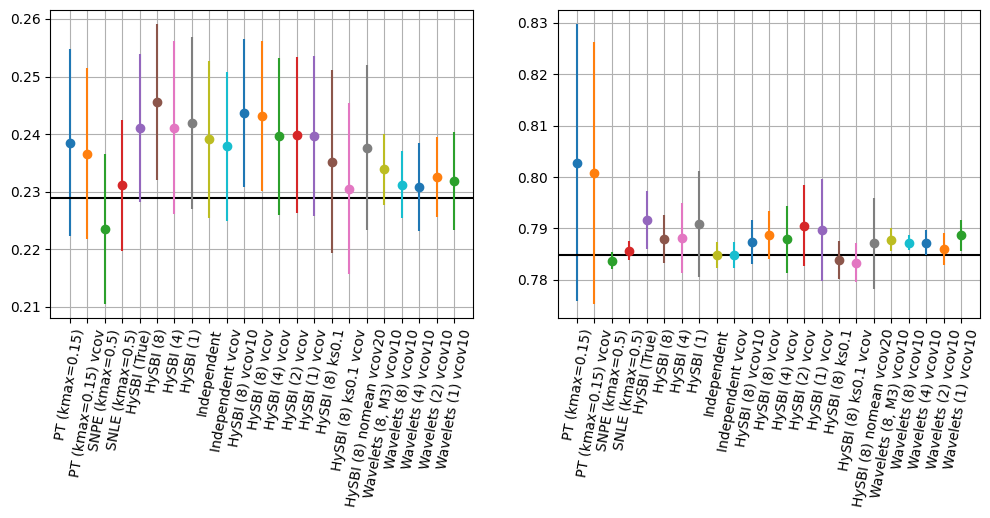

In [17]:
for isim in allsamples.keys():
    print(isim)
    print(params[isim])

    samples = allsamples[isim]
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))

    xaxis = []
    ik = 0 
    for key in samples.keys():
        mu, std = samples[key].mean(axis=(0, 1)), samples[key].std(axis=(0, 1))
        j = 0 
        ax[0].errorbar(ik, mu[..., j], std[..., j], marker='o')
        if not ik: ax[0].axhline(params[isim, j], color='k')
        j = 4
        ax[1].errorbar(ik, mu[..., j], std[..., j], marker='o')
        if not ik: ax[1].axhline(params[isim, j], color='k')
        xaxis.append([ik, key])
        ik += 1


    xaxis = np.array(xaxis).T
    for axis in ax:
        axis.set_xticks(xaxis[0].astype(float)) 
        axis.set_xticklabels(xaxis[1], rotation=80) 
        axis.grid(which='both')
        # axis.set_xticklabels([1,4,5], fontsize=12)
    plt.show()

In [18]:
len(allsamples.keys())

23

# corner plot

In [17]:
import matplotlib.patches as mpatches
import arviz as az


In [18]:
allsamples.keys(), samples.keys()

(dict_keys([865, 919, 807, 1847, 663, 1964, 121, 696, 749, 1539, 1304, 11, 872, 594, 1630, 1329, 909, 964, 84, 908, 1289, 115, 87]),
 dict_keys(['PT (kmax=0.15)', 'PT (kmax=0.15) vcov', 'SNPE (kmax=0.5)', 'SNLE (kmax=0.5)', 'HySBI (True)', 'HySBI (8)', 'HySBI (4)', 'HySBI (1)', 'Independent', 'Independent vcov', 'HySBI (8) vcov10', 'HySBI (8) vcov', 'HySBI (4) vcov', 'HySBI (2) vcov', 'HySBI (1) vcov', 'HySBI (8) ks0.1', 'HySBI (8) ks0.1 vcov', 'HySBI (8) nomean vcov20', 'Wavelets (8, M3) vcov10', 'Wavelets (8) vcov10', 'Wavelets (4) vcov10', 'Wavelets (2) vcov10', 'Wavelets (1) vcov10']))

AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)


Text(0, 0.5, '$\\sigma_8$')

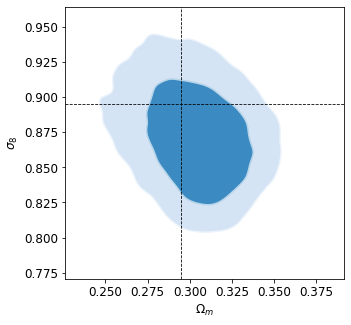

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))


alpha = 1.0
hdip = [0.68,0.95]
isim = 919
samples = allsamples[isim]
                     
ss = samples['PT (kmax=0.15) vcov']
cmp = plt.cm.Blues
print(ax)
ax = az.plot_kde(ss[..., 0].flatten(), ss[..., 4].flatten(),
            contour_kwargs={"colors":None, "cmap":cmp} ,
            contourf_kwargs={"colors":None, "cmap":cmp, "alpha":alpha}, ax=ax, hdi_probs=hdip)
print(ax)
ax.xaxis.set_tick_params(labelsize=12)
ax.yaxis.set_tick_params(labelsize=12)
# ss = samples['HySBI (8) vcov']
# cmp = plt.cm.Greens
# az.plot_kde(ss[..., 0].flatten(), ss[..., 4].flatten(),
#             contour_kwargs={"colors":None, "cmap":cmp} ,
#             contourf_kwargs={"colors":None, "cmap":cmp, "alpha":alpha}, ax=ax, hdi_probs=hdip)

# ss = samples['SNLE (kmax=0.5)']
# cmp = plt.cm.Oranges
# az.plot_kde(ss[..., 0].flatten(), ss[..., 4].flatten(),
#             contour_kwargs={"colors":None, "cmap":cmp} ,
#             contourf_kwargs={"colors":None, "cmap":cmp, "alpha":alpha}, ax=ax, hdi_probs=hdip)

# ss = samples['Wavelets (8, M4) vcov10']
# cmp = plt.cm.Reds
# az.plot_kde(ss[..., 0].flatten(), ss[..., 4].flatten(),
#             contour_kwargs={"colors":None, "cmap":cmp} ,
#             contourf_kwargs={"colors":None, "cmap":cmp, "alpha":alpha}, ax=ax, hdi_probs=hdip)



plt.axvline(params[isim, 0], color='k', lw=0.8, ls="--")
plt.axhline(params[isim, 4], color='k', lw=0.8, ls="--")
ax.set_xlabel('$\Omega_m$', fontsize=12)
ax.set_ylabel('$\sigma_8$', fontsize=12)

In [30]:
def plot_samples(samples, cmp, ndim=2, cols=[0, 4], alpha_c=0.7, hdi_probs=[0.68, 0.95], figax=None, label=None, lw=2, cmpv=128, ls='-'):   

    if figax is None:
        fig, axar = plt.subplots(ndim, ndim, figsize=(3*ndim, 3*ndim), sharex='col')
    else:
        fig, axar = figax

    for i in range(ndim):
        
        az.plot_kde(samples[:, cols[i]],  ax=axar[i, i], plot_kwargs={"color":cmp(cmpv), "lw":lw, "ls":ls}, label=label)
        axar[i, i].set_yticks([])
        
        for j in range(0, i):
            az.plot_kde(samples[:, cols[j]], samples[:, cols[i]],
                        contour_kwargs={"colors":None, "cmap":cmp} ,
                        contourf_kwargs={"colors":None, "cmap":cmp, "alpha":alpha_c}, ax=axar[i, j], hdi_probs=hdi_probs)

        for j in range(i+1, ndim):
            axar[i, j].set_axis_off()
            
    return fig, axar




In [21]:
allsamples.keys()

dict_keys([865, 919, 807, 1847, 663, 1964, 121, 696, 749, 1539, 1304, 11, 872, 594, 1630, 1329, 909, 964, 84, 908, 1289, 115, 87])

In [22]:
!ls

 desivol.pdf				     play_hybrid_conditioning.ipynb
 field_statistics.ipynb			     play_hydbi.ipynb
 numerical-convolution-matrix3-Copy1.ipynb   pt_matter_oliver.ipynb
 numerical-convolution-matrix3.ipynb	     sbi-logs
 paper_figs				    'sub-boxes data.ipynb'
 paper_figs.ipynb			     tmp
 play_hybrid_conditioning-dk2.ipynb	     tmp-dk2


872


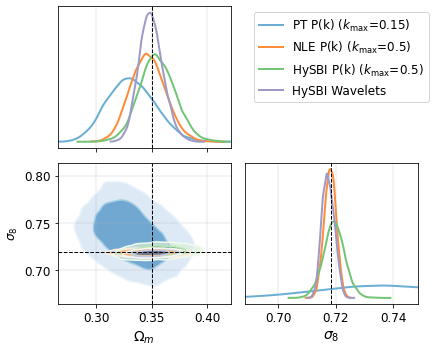

In [23]:
isimn = 15
isim = list(allsamples.keys())[isimn]
isim = 872
print(isim)
samples = allsamples[isim]

fig, ax = plt.subplots(2, 2, figsize=(6, 5), sharex='col')

ss = samples['PT (kmax=0.15) vcov']
cmp = plt.cm.Blues
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label=r'PT P(k) ($k_{\mathrm{max}}$=0.15)')

ss = samples['SNLE (kmax=0.5)']
cmp = plt.cm.Oranges
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='NLE P(k) ($k_{\mathrm{max}}$=0.5)')

ss = samples['HySBI (8) vcov']
cmp = plt.cm.Greens
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI P(k) ($k_{\mathrm{max}}$=0.5)')

ss = samples['Wavelets (8) vcov10']
cmp = plt.cm.Purples
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI Wavelets')

for axis in ax.flatten():
    axis.grid(which='both', lw=0.3)
    axis.xaxis.set_tick_params(labelsize=12)
    axis.yaxis.set_tick_params(labelsize=12)

ax[1, 1].axvline(params[isim, 4], color='k', lw=1, ls='--')
ax[0, 0].axvline(params[isim, 0], color='k', lw=1, ls='--')
ax[1, 0].axvline(params[isim, 0], color='k', lw=1, ls='--')
ax[1, 0].axhline(params[isim, 4], color='k', lw=1, ls='--')
ax[1, 1].set_xlim(params[isim, 4]-0.03, params[isim, 4]+0.03)

ax[1, 1].set_xlabel(r'$\sigma_8$', fontsize=14)
ax[1, 0].set_ylabel(r'$\sigma_8$', fontsize=12)
ax[1, 0].set_xlabel(r'$\Omega_m$', fontsize=14)

plt.tight_layout()

ax[0, 0].legend(fontsize=12, bbox_to_anchor=(1.1, 1))
ax[1, 1].legend().set_visible(False)

# plt.tight_layout()
# plt.savefig(f'./paper_figs/lh{isim}.png')
# plt.savefig(f'./paper_figs/lh{isim}.pdf')

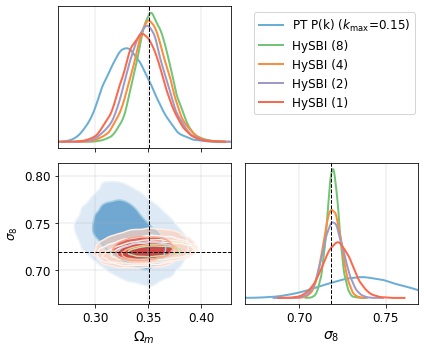

In [24]:
# isim = 11
samples = allsamples[isim]
                         
fig, ax = plt.subplots(2, 2, figsize=(6, 5), sharex='col')

ss = samples['PT (kmax=0.15) vcov']
cmp = plt.cm.Blues
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label=r'PT P(k) ($k_{\mathrm{max}}$=0.15)')

ss = samples['HySBI (8) vcov']
cmp = plt.cm.Greens
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI (8)')

ss = samples['HySBI (4) vcov']
cmp = plt.cm.Oranges
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI (4)')

ss = samples['HySBI (2) vcov']
cmp = plt.cm.Purples
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI (2)')

ss = samples['HySBI (1) vcov']
cmp = plt.cm.Reds
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI (1)')

for axis in ax.flatten():
    axis.grid(which='both', lw=0.3)
    axis.xaxis.set_tick_params(labelsize=12)
    axis.yaxis.set_tick_params(labelsize=12)
    
ax[1, 1].axvline(params[isim, 4], color='k', lw=1, ls='--')
ax[0, 0].axvline(params[isim, 0], color='k', lw=1, ls='--')
ax[1, 0].axvline(params[isim, 0], color='k', lw=1, ls='--')
ax[1, 0].axhline(params[isim, 4], color='k', lw=1, ls='--')
ax[1, 1].set_xlim(params[isim, 4]-0.05, params[isim, 4]+0.05)

ax[1, 1].set_xlabel(r'$\sigma_8$', fontsize=14)
ax[1, 0].set_ylabel(r'$\sigma_8$', fontsize=12)
ax[1, 0].set_xlabel(r'$\Omega_m$', fontsize=14)

# plt.suptitle('Sample variance for PS')
plt.tight_layout()

ax[0, 0].legend(fontsize=12, bbox_to_anchor=(1.1, 1))
ax[1, 1].legend().set_visible(False)
# plt.tight_layout()
# plt.savefig(f'./paper_figs/lh{isim}_pk.png')
# plt.savefig(f'./paper_figs/lh{isim}_pk.pdf')

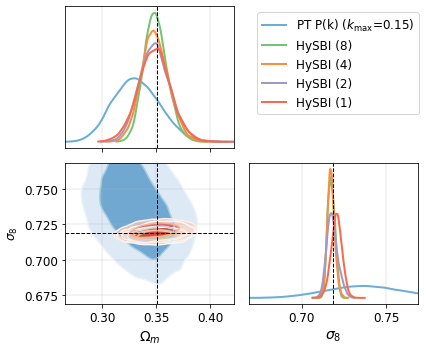

In [25]:
# isim = 11
samples = allsamples[isim]
                         
fig, ax = plt.subplots(2, 2, figsize=(6, 5), sharex='col')

ss = samples['PT (kmax=0.15) vcov']
cmp = plt.cm.Blues
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label=r'PT P(k) ($k_{\mathrm{max}}$=0.15)')

ss = samples['Wavelets (8) vcov10']
cmp = plt.cm.Greens
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI (8)')

ss = samples['Wavelets (4) vcov10']
cmp = plt.cm.Oranges
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI (4)')

ss = samples['Wavelets (2) vcov10']
cmp = plt.cm.Purples
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI (2)')

ss = samples['Wavelets (1) vcov10']
cmp = plt.cm.Reds
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI (1)')

for axis in ax.flatten():
    axis.grid(which='both', lw=0.3)
    axis.xaxis.set_tick_params(labelsize=12)
    axis.yaxis.set_tick_params(labelsize=12)
    
ax[1, 1].axvline(params[isim, 4], color='k', lw=1, ls='--')
ax[0, 0].axvline(params[isim, 0], color='k', lw=1, ls='--')
ax[1, 0].axvline(params[isim, 0], color='k', lw=1, ls='--')
ax[1, 0].axhline(params[isim, 4], color='k', lw=1, ls='--')
ax[1, 1].set_xlim(params[isim, 4]-0.05, params[isim, 4]+0.05)
ax[1, 0].set_ylim(params[isim, 4]-0.05, params[isim, 4]+0.05)

ax[1, 1].set_xlabel(r'$\sigma_8$', fontsize=14)
ax[1, 0].set_ylabel(r'$\sigma_8$', fontsize=12)
ax[1, 0].set_xlabel(r'$\Omega_m$', fontsize=14)

# plt.suptitle('Sample variance for Wavelets')

plt.tight_layout()

ax[0, 0].legend(fontsize=12, bbox_to_anchor=(1.1, 1))
ax[1, 1].legend().set_visible(False)
# plt.tight_layout()
# plt.savefig(f'./paper_figs/lh{isim}_wavelets.png')
# plt.savefig(f'./paper_figs/lh{isim}_wavelets.pdf')

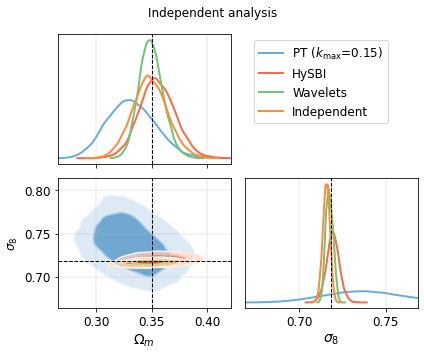

In [26]:
samples = allsamples[isim]
                         
fig, ax = plt.subplots(2, 2, figsize=(6, 5), sharex='col')

ss = samples['PT (kmax=0.15) vcov']
cmp = plt.cm.Blues
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label=r'PT ($k_{\mathrm{max}}$=0.15)')

ss = samples['HySBI (8) vcov']
cmp = plt.cm.Reds
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI')

ss = samples['Wavelets (8) vcov10']
cmp = plt.cm.Greens
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='Wavelets')

ss = samples['Independent vcov']
cmp = plt.cm.Oranges
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='Independent')


for axis in ax.flatten():
    axis.grid(which='both', lw=0.3)
    axis.xaxis.set_tick_params(labelsize=12)
    axis.yaxis.set_tick_params(labelsize=12)
    
ax[1, 1].axvline(params[isim, 4], color='k', lw=1, ls='--')
ax[0, 0].axvline(params[isim, 0], color='k', lw=1, ls='--')
ax[1, 0].axvline(params[isim, 0], color='k', lw=1, ls='--')
ax[1, 0].axhline(params[isim, 4], color='k', lw=1, ls='--')
ax[1, 1].set_xlim(params[isim, 4]-0.05, params[isim, 4]+0.05)

ax[1, 1].set_xlabel(r'$\sigma_8$', fontsize=14)
ax[1, 0].set_ylabel(r'$\sigma_8$', fontsize=12)
ax[1, 0].set_xlabel(r'$\Omega_m$', fontsize=14)

plt.suptitle('Independent analysis')

plt.tight_layout()

ax[0, 0].legend(fontsize=12, bbox_to_anchor=(1.1, 1))
ax[1, 1].legend().set_visible(False)
# plt.tight_layout()

872


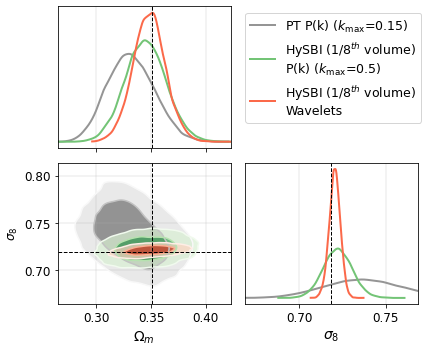

In [49]:
isimn = 15
isim = list(allsamples.keys())[isimn]
isim = 872
print(isim)
samples = allsamples[isim]

fig, ax = plt.subplots(2, 2, figsize=(6, 5), sharex='col')

ss = samples['PT (kmax=0.15) vcov']
cmp = plt.cm.Greys
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label=r'PT P(k) ($k_{\mathrm{max}}$=0.15)')

# ss = samples['HySBI (8) vcov']
# cmp = plt.cm.Greens
# plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI P(k) ($k_{\mathrm{max}}$=0.5)')

ss = samples['HySBI (1) vcov']
cmp = plt.cm.Greens
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI (1/8$^{th}$ volume)\nP(k) ($k_{\mathrm{max}}$=0.5)', ls="-")

# ss = samples['Wavelets (8) vcov10']
# cmp = plt.cm.Reds
# plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI Wavelets')

ss = samples['Wavelets (1) vcov10']
cmp = plt.cm.Reds
plot_samples(ss.reshape(-1, ss.shape[-1]), cmp=cmp, figax=[fig, ax], label='HySBI (1/8$^{th}$ volume)\nWavelets', ls="-")

for axis in ax.flatten():
    axis.grid(which='both', lw=0.3)
    axis.xaxis.set_tick_params(labelsize=12)
    axis.yaxis.set_tick_params(labelsize=12)

ax[1, 1].axvline(params[isim, 4], color='k', lw=1, ls='--')
ax[0, 0].axvline(params[isim, 0], color='k', lw=1, ls='--')
ax[1, 0].axvline(params[isim, 0], color='k', lw=1, ls='--')
ax[1, 0].axhline(params[isim, 4], color='k', lw=1, ls='--')
ax[1, 1].set_xlim(params[isim, 4]-0.05, params[isim, 4]+0.05)

ax[1, 1].set_xlabel(r'$\sigma_8$', fontsize=14)
ax[1, 0].set_ylabel(r'$\sigma_8$', fontsize=12)
ax[1, 0].set_xlabel(r'$\Omega_m$', fontsize=14)

plt.tight_layout()

ax[0, 0].legend(fontsize=12.5, bbox_to_anchor=(1.05, 1))
ax[1, 1].legend().set_visible(False)

# plt.tight_layout()
# plt.savefig(f'./paper_figs/lh{isim}_1box.png')
# plt.savefig(f'./paper_figs/lh{isim}_1box.pdf')
# plt.tight_layout()
# plt.savefig(f'./paper_figs/lh{isim}.png')
# plt.savefig(f'./paper_figs/lh{isim}.pdf')

In [27]:
stdspk = []

for isim in allsamples.keys():
    samples = allsamples[isim]

    stds = []
    ss = samples['PT (kmax=0.15) vcov']
    stds.append(ss.std(axis=(0, 1)))

    ss = samples['HySBI (8) vcov']
    stds.append(ss.std(axis=(0, 1)))

    ss = samples['HySBI (4) vcov']
    stds.append(ss.std(axis=(0, 1)))

    ss = samples['HySBI (2) vcov']
    stds.append(ss.std(axis=(0, 1)))

    ss = samples['HySBI (1) vcov']
    stds.append(ss.std(axis=(0, 1)))

    stdspk.append(np.array([(stds[i]/stds[1])[[0, 4]] for i in range(5)]))
stdspk = np.array(stdspk)

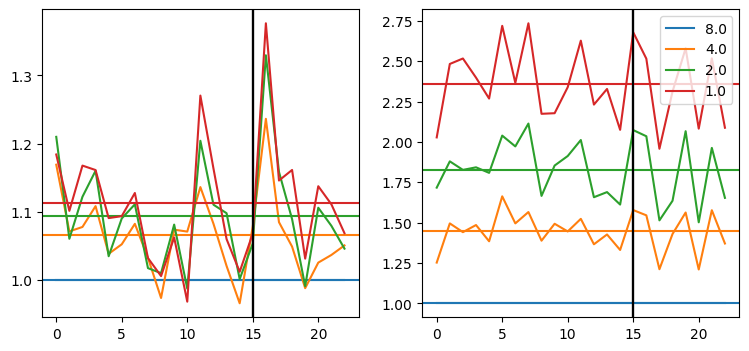

In [30]:
plt.figure(figsize=(9, 4))
for i in range(4):
    plt.subplot(121)
    plt.plot(stdspk[:, i+1, 0], label=f'{8/2**i}')
    plt.axhline(stdspk[:, i+1, 0].mean(axis=0), color=f'C{i}')
    plt.axvline(isimn, color='k')

    plt.subplot(122)
    plt.plot(stdspk[:, i+1, 1], label=f'{8/2**i}')
    plt.axhline(stdspk[:, i+1, 1].mean(axis=0), color=f'C{i}')
    plt.axvline(isimn, color='k')

plt.legend()

In [31]:
stdswv = []

for isim in allsamples.keys():
    stds = []
    samples = allsamples[isim]

    ss = samples['PT (kmax=0.15) vcov']
    stds.append(ss.std(axis=(0, 1)))

    ss = samples['Wavelets (8) vcov10']
    stds.append(ss.std(axis=(0, 1)))

    ss = samples['Wavelets (4) vcov10']
    stds.append(ss.std(axis=(0, 1)))

    ss = samples['Wavelets (2) vcov10']
    stds.append(ss.std(axis=(0, 1)))

    ss = samples['Wavelets (1) vcov10']
    stds.append(ss.std(axis=(0, 1)))

    stdswv.append(np.array([(stds[i]/stds[1])[[0, 4]] for i in range(5)]))
    # stdswv.append(np.array([(stds[i])[[0, 4]] for i in range(5)]))
stdswv = np.array(stdswv)

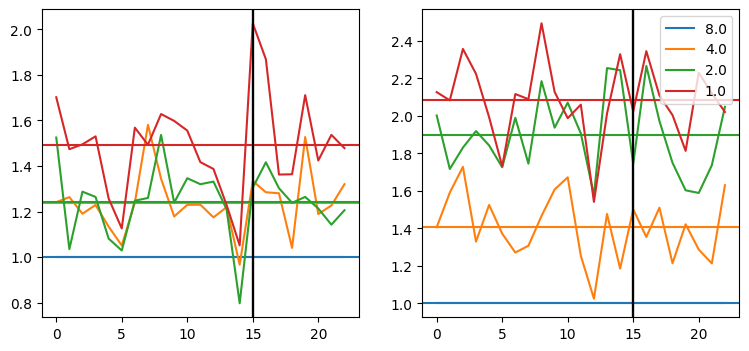

In [32]:
plt.figure(figsize=(9, 4))
for i in range(4):
    plt.subplot(121)
    plt.plot(stdswv[:, i+1, 0], label=f'{8/2**i}', color=f'C{i}')
    plt.axhline(stdswv[:, i+1, 0].mean(axis=0), color=f'C{i}')
    plt.axvline(isimn, color='k')
    
    plt.subplot(122)
    plt.plot(stdswv[:, i+1, 1], label=f'{8/2**i}', color=f'C{i}')
    plt.axhline(stdswv[:, i+1, 1].mean(axis=0), color=f'C{i}')
    plt.axvline(isimn, color='k')

    plt.legend()


In [33]:
stdspk.mean(axis=0)-1, stdswv.mean(axis=0)-1

(array([[0.19818751, 4.70756204],
        [0.        , 0.        ],
        [0.06513612, 0.44482311],
        [0.09328497, 0.82762459],
        [0.1128512 , 1.35611876]]),
 array([[ 1.18954817, 13.42695598],
        [ 0.        ,  0.        ],
        [ 0.23784718,  0.40612121],
        [ 0.24320293,  0.89785727],
        [ 0.49039908,  1.08416119]]))

# Indep

In [34]:
indeplist = ['/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_indep_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10_varycov//LH%d.npy',
'/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens10/LH%d.npy',
'/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH%d.npy',
]        
indepkeys = ['indep', 'hysbi', 'hysbivcov']

In [ ]:
ssamples = {} 
for isim in testidx:
    ss = {}    
    for ik, fname in enumerate(indeplist):
        key = indepkeys[ik]
        try:
            ss[key] = clean_chains(np.load(fname%isim))
            # ss[key] = np.load(fname%isim)
        except Exception as e:
            print(e)
        ssamples[isim] = ss

[Errno 2] No such file or directory: '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_indep_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10_varycov//LH73.npy'
[Errno 2] No such file or directory: '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH73.npy'
[Errno 2] No such file or directory: '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_indep_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10_varycov//LH1640.npy'
[Errno 2] No such file or directory: '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_dk2/kmax0.5-kmin0.001-ksplit0.15-meanf-nsubs8-splits2-standardize-standardize_cond-style-deconv/ens20_varycov/LH1640.npy'
[Errno 2] No such file or directory: '/mnt/ceph/users/cmodi/HySBI/matter/samples/hybrid2_indep_dk2/kmax0.5-kmin0.15-meanf-nsubs8-splits2-standardize-style-deconv/ens10_varycov//LH1462.npy'
[Errno 2] No su

In [ ]:
ssamples[1068]['indep'].shape

In [102]:
key

'hysbivcov'

In [103]:
mus, stds = {}, {}
for key in indepkeys:
    m, s = [], []
    for isim in testidx:
        try:
            m.append(ssamples[isim][key].mean(axis=(0, 1))[:5] - params[isim])
            s.append(ssamples[isim][key].std(axis=(0, 1))[:5])
        except: pass
    mus[key] = np.array(m)
    stds[key] = np.array(s)

Text(0.5, 1.0, '$\\Omega_m$')

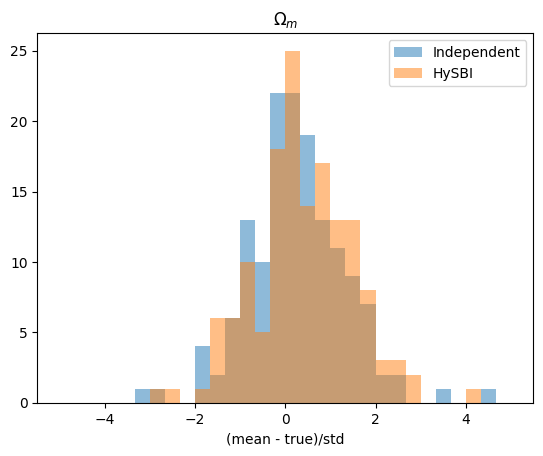

In [122]:
res = mus['indep']/stds['indep']
plt.hist(res[:, 0], bins=30, alpha=0.5, range=(-5, 5), label='Independent');
# res = mus['hysbi']/stds['hysbi']
# plt.hist(res[:, 0], bins=30, alpha=0.5);
res = mus['hysbivcov']/stds['hysbivcov']
plt.hist(res[:, 0], bins=30, alpha=0.5, range=(-5, 5), label='HySBI');
plt.legend()
plt.xlabel('(mean - true)/std')
plt.title('$\Omega_m$')

Text(0.5, 1.0, '$\\sigma_8$')

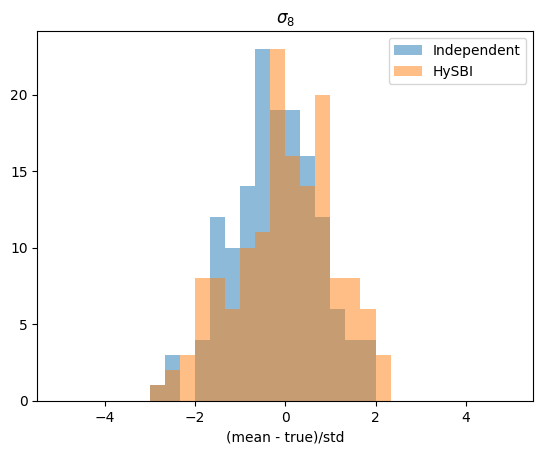

In [124]:
res = mus['indep']/stds['indep']
plt.hist(res[:, 4], bins=30, alpha=0.5, range=(-5, 5), label='Independent');
# res = mus['hysbi']/stds['hysbi']
# plt.hist(res[:, 0], bins=30, alpha=0.5);
res = mus['hysbivcov']/stds['hysbivcov']
plt.hist(res[:, 4], bins=30, alpha=0.5, range=(-5, 5), label='HySBI');
plt.legend()
plt.xlabel('(mean - true)/std')
plt.title('$\sigma_8$')